# Block C: Creative Brief Template

Please, use this template to write down your solutions to the [DataLab Tasks](). If you have any questions, please, contact your mentor or the content responsible. 

## Important Notes:
- [ ] Please, rename the file to ```CreativeBrief_<your_name>_<studentnumber>.ipynb``` before submitting it. 
- [ ] Upload this template to the 'Deliverables' folder in you BUas GitHub repository.
- [ ] You are allowed to add as many (Markdown/Python) cells as you need. 
- [ ] If more iteration steps were performed for the tasks in Section 3, please add more iteration sections.
- [ ] If less iteration steps were needed for the tasks in Section 3, please remove the empty iteration sections.
- [ ] If the task requires you to only write code or text, please, delete the unnecessary cell.
- [ ] Your work should be reproducible, meaning that we should be able to run your code in the template and get the same results as you did. Tip: use relative paths to load your data!
- [ ] Ensure that before you hand in the template, you press ```Restart & Run all```; we should be able to see the results of your code in the notebook (i.e., output cells).
- [ ] Ensure that your code in the template is ```error-free```. In other words, we should not see any error messages when we run your code.

## Libraries

In [19]:
import os
import numpy as np
import tensorflow as tf
import skimage as ski
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow import keras
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import concurrent.futures
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import EarlyStopping
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import Dense, Conv2D, Flatten
from keras.layers import MaxPooling2D, Dropout
from keras.applications import VGG16
from keras.optimizers import Adam
from copy import deepcopy
from sklearn.metrics import confusion_matrix
import seaborn as sns
from sklearn.metrics import classification_report
from math import ceil
from time import time
import xplique
from xplique.attributions import IntegratedGradients
from xplique.plots import plot_attributions
from skimage.segmentation import quickshift, felzenszwalb, watershed, slic
from skimage.color import rgb2gray
from skimage.filters import sobel
from xplique.attributions import Lime, KernelShap


Caching the list of root modules, please wait!
(This will only be done once - type '%rehashx' to reset cache!)



/Users/daria/anaconda3/envs/XAI/lib/python3.11/site-packages/IPython/core/completerlib.py:149: UserWarning: using rootmodules_cache requires you to install the `pickleshare` library.
  ip.db['rootmodules_cache'] = rootmodules_cache


# Section 1 - Business Understanding (Week 1, Market Research for Product Development, Stakeholders & DAPS)

## Task 1.1: Market Research

Inventory management can pose a serious challenge for bars and restaurants. Misjudging the quantities of perishable stock could lead to either an abundance of waste or not enough stock to fulfil orders and maintain customer satisfaction at a constantly high rate. Both scenarios can affect profit. As Retail Focus (2023) reports, inventory management issues are the second most common challenges that bars and restaurants face. Since this industry brought the Netherlands 3.87bn Euros last year alone, it is important to assess these challenges and try to implement a solution that will contribute to mediating this common problem. (Statista Research Department, 2024)

An automated inventory management system is an emerging restaurant technology as BlueCart communicates (BlueCart,2022). An algorithm that would help bars keep track of drinks and cocktail fruits stock by classifying the beverages would be a good solution proposal. It would also automatically alert a manager about the inventory situation (if the bar/ restaurant is under-, over-, or just rightly stocked, or even if the order from the supplier is complete).

Additionally, these facts have been confirmed after conducting an interview with the restaurant owner where I personally work. He stated that he would welcome such technology, as he has stock problems constantly. However, he would only accept it at a reasonable cost since he believes that putting so much trust in such a new technology would be quite risky.

Resources:

https://retail-focus.co.uk/8-common-challenges-for-bars-and-restaurants-and-how-to-solve-them/

https://www.bluecart.com/guides/the-restaurant-industry#toc-benefits-of-technology-in-restaurants

https://www.statista.com/topics/6017/restaurant-and-catering-industry-netherlands/#topicOverview

## Task 1.2: Stakeholder Analysis

__1. Characteristics__

Owner
- A bar or restaurant owner, a key stakeholder, prioritizes efficiency and cost-effectiveness in inventory management. They value practical solutions aligned with the restaurant's infrastructure and budget, while also considering customer satisfaction.
Manager(s)
- The restaurant manager, as a secondary stakeholder prioritizes operational efficiency, cost-effectiveness, and customer satisfaction. They focus on streamlining processes, optimizing resource allocation, and adopting technology solutions that enhance efficiency. Additionally, they evaluate the potential benefits and risks of new technologies, seeking measurable outcomes such as reduced stockouts and improved inventory accuracy. A manager also works with other stakeholders and would ensure successful implementation for the image classifier solution.

Kitchen chef/ main bar operator
- The head chef/ main bar operator prioritizes quality assurance, operational efficiency, and resource allocation. While primarily focused on culinary aspects, they understand the importance of efficient stock management for maintaining smooth kitchen operations and menu quality. At the end of the day, they are responsible for the kitchen/ other bar staff. To try and reduce waste, the head chef evaluates outcomes based on their impact on kitchen operations, such as reduced stockouts and improved ingredient availability.

Front-of-house staff
- The front-of-house staff prioritize customer satisfaction and operational efficiency. They understand the importance of fast access to beverages for delivering quality service.

Suppliers
- The suppliers want timely order fulfillment and maintaining business relationships. While they may not be directly involved in day-to-day operations, they value solutions that streamline inventory processes and ensure accurate stock levels in order to maximise efficiency.

__2. Prioritization__
- High Power, High Interest:
  
Restaurant Owner: With significant authority over resources, the owner holds both high power and high interest in the project. They are the ones most interested in operational efficiency and cost-effectiveness.

Restaurant Manager: As the individual directly responsible for day-to-day operations, the manager also possesses considerable power and interest in ensuring the success of the inventory management.


- High Power, Low Interest:
  
Head Chef: While the head chef may have authority over kitchen operations and resource allocation, their primary focus might be on culinary aspects rather than inventory management. Therefore, they may have high power but relatively low interest in the project.


- Low Power, High Interest:
  
Front-of-House Staff: While they may not wield significant decision-making authority, front-of-house staff members have a keen interest in inventory management as it directly impacts customer service and satisfaction. They possess high interest but relatively low power in influencing project outcomes.


- Low Power, Low Interest:
  
Suppliers: Suppliers may have limited power and interest in the specific details of the inventory management project, as their primary concern is fulfilling orders and maintaining business relationships rather than the internal workings of the restaurant's operations.

__3. Main stakeholder__
- The main stockholder is the restaurant/ bar owner.  As they are the ultimate authority over the restaurant's operations and finances, the owner holds significant decision-making power and bears ultimate responsibility and interest for the success and profitability of the business. As the owner mainly focuses on improving operational efficiency, reducing costs, and enhancing customer satisfaction, their perspective will heavily influence project priorities, resource allocation, and the overall approach to implementing the image classifier solution. Therefore, understanding the needs, goals, and concerns of the restaurant owner is essential for driving project success and securing support for the initiative.

## Task 1.3: The DAPS Diagram

Link to the DAPS diagram:

https://github.com/BredaUniversityADSAI/2023-24c-fai1-adsai-dariavladutu236578/blob/main/Week%201%20-%20Responsible%20AI/DAPS%20DIAGRAM.png

__1. The data-analytic problem__
- <img src = 'Lower%20part%20of%20DAPS.png' width='600'>

__2. The decision framework__
- <img src = 'Middle%20part%20of%20DAPS.png' width='600'>

__3. The business value__
- <img src = 'Upper%20part%20of%20DAPS.png' width='600'>

## Task 1.4: The First Idea

Title of the application: Barman's helper

The image classifier product that I decided to train would classify objects such as alcoholic beverages bottles, non-alcoholic beverages, cocktail fruits, and coffee grounds packages. This algorithm's purpose would be to help bars/ restaurant bars keep track of the primary inventory and notify the staff when another order is needed. 

The algorithm would be implemented in a tablet like system. The managers would place an order through the application. When an order would arrive, the staff would take photos of each item and would manually input the quantity received. The system would also keep track on inventory based on the orders throughout the day (when the waiters take orders and input them in the system).

The main problem I believe my idea would alleviate is profit loss. Another problem for which this algorithm would be a solution is lowering employee stress (especially managers) when having to handle a situation where ingredients are not in stock. For example, in a restaurant that primarily serves breakfast and lunch, if the inventory is almost out of coffee grounds, that translates into a huge proportion of the day's profit being lost, since customers that dine at such a restaurant are mainly consuming coffee drinks.

This would help the staff always have stock on hand, avoiding situations where the organisation would lose money due to customers ordering a specific drink, and the inventory being out of the required ingredient(s).

# Section 2A - Responsible AI (Fairness & Bias, Week 1)

## Task 2.1: Create a Dataset 

In order to create a dataset for the image recognition algorithm in order to present my solution so the business problem, I first had to scrape said images from Google Images. I used Github Deskto, where I cloned the repository from a URL adress (https://github.com/ohyicong/Google-Image-Scraper.git). I then created and activated an evironment using anaconda, and then installed the required Python packages listed in the requirements file provided in the repository. 

I then adjusted the search parameters in the main.py file to my desire (imputed 8 search keys and changed the number of images to 1000). I then ran the python file to get the images.

I went through all of the images that were scraped and deleted the ones that were unfit.

In [ ]:
# Image scraping from google images

def worker_thread(search_key):
    image_scraper = GoogleImageScraper(
        webdriver_path, 
        image_path, 
        search_key, 
        number_of_images, 
        headless, 
        min_resolution, 
        max_resolution, 
        max_missed)
    image_urls = image_scraper.find_image_urls()
    image_scraper.save_images(image_urls, keep_filenames)

    #Release resources
    del image_scraper

if __name__ == "__main__":
    #Define file path
    webdriver_path = os.path.normpath(os.path.join(os.getcwd(), 'webdriver', webdriver_executable()))
    image_path = os.path.normpath(os.path.join(os.getcwd(), 'photos'))

    #Add new search key into array ["cat","t-shirt","apple","orange","pear","fish"]
    search_keys = list(set(["alcoholic beverages bottle","non-alcoholic beverages bottle",'non-alcoholic beverages can', 'strawberries', 'forest fruits', 'berries', 'lemon slices', 'coffee grounds package']))

    #Parameters
    number_of_images = 1000                # Desired number of images
    headless = True                     # True = No Chrome GUI
    min_resolution = (0, 0)             # Minimum desired image resolution
    max_resolution = (9999, 9999)       # Maximum desired image resolution
    max_missed = 10                     # Max number of failed images before exit
    number_of_workers = 5            # Number of "workers" used
    keep_filenames = False              # Keep original URL image filenames

    #Run each search_key in a separate thread
    #Automatically waits for all threads to finish
    #Removes duplicate strings from search_keys
    with concurrent.futures.ThreadPoolExecutor(max_workers=number_of_workers) as executor:
        executor.map(worker_thread, search_keys)


In [ ]:
# Folder paths where the images of each class are stored
folder_paths = [
    "dataset_copy/alcoholic_beverages_bottle",
    "dataset_copy/non-alcoholic_beverages_bottle",
    "dataset_copy/non-alcoholic_beverages",
    "dataset_copy/lemon_lime",
    "dataset_copy/cocktail_fruits",
    "dataset_copy/coffee_grounds_package"

]
# Class labels for the images (same order as folder_paths)
class_names = [
    "alcoholic_beverages_bottle", 
    "non-alcoholic_beverages_bottle",
    "non-alcoholic_beverages",
    "lemon_lime",
    "cocktail_fruits",
    "coffee_grounds_package"
]

# Target size to resize the images
target_size = (64, 64)

# Arrays to store the images (X) and class labels (y)
X = []
y = []

for i in range(len(folder_paths)):
    for filename in os.listdir(folder_paths[i]):
        file_extension = os.path.splitext(filename)[1]
        # Check if the file extension is an image extension 
        if file_extension == ".jpg" or file_extension == ".jpeg" or file_extension == ".png": 
            image_filename = os.path.join(folder_paths[i], filename)
            # Read the image file using scikit-image
            image = ski.io.imread(image_filename)
            # Normalize the image to values between 0 and 1
            image = image / 255.0
            # Resize the image to the target_size
            image_resized = ski.transform.resize(image, target_size)            
            # Insert the image into array X
            X.append(image_resized)
            # Insert the class label into array y
            y.append(class_names[i])
            
# Convert of arrays into numpy arrays
X = np.array(X)
y = np.array(y)

In [ ]:
# Split data into training (70%) and temp (30%) for the validation and test sets
X_train_temp, X_test, y_train_temp, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Split temp data into validation (20%) and final test (10%)
X_train, X_val, y_train, y_val = train_test_split(X_train_temp, y_train_temp, test_size=1/3, random_state=42)

The data has been split into training (70% of the data), test (20% of the data) and validation (10% of the data) sets in section 3.1.

My dataset is available here: [LINK](https://edubuas-my.sharepoint.com/:f:/g/personal/236578_buas_nl/EqPRwGCfn8ZOqrnMo9xvLJUBJmtJ3XtrI_km8KFgtxRKqw?e=0NQLYi)

## Task 2.2: Identify, and Describe Bias

Task 2.2

**Define the concept of bias in relation to your own custom dataset or the full Imsitu dataset, and a computer vision task.**

Bias in the context of the full Imsitu dataset refers to systematic errors or inaccuracies present in the data that can skew the performance or outcomes of machine learning algorithms or computer vision models. These biases can arise from various sources and can have significant implications for the fairness and accuracy of the model’s predictions.

**List and describe the type of bias that you identified in the dataset.**

When searching for the adjective 'misbehaving' in combination with the nouns 'men' or 'female', the results reflected an implicit sexist bias that exists in our society. The dataset contributed to the belief that women should always be proper, quiet and obedient. The 'misbehaving' woman is loud, appears upset, and clearly expresses her anger. Whereas the 'misbehaving' man is violent, or even what appears to be harrasing two women on the bus. Shockingly, in one of the photos of misbehaving men, we can also see a man being 'nagged' by a woman, even though the subject of the photo is a male individual, the woman is still portrayed as the villan.

**Discuss the possible ramifications (e.g., harm) in terms of fairness of the identified bias instance:**
**(Why, and when, is this particular instance of bias undesirable? In other words, who might be disproportionally affected by this particular instance of bias, and when does this negative effect come into play?)**

The detected implicit bias found in the dataset can be potentially very harmful in the context of training an image classifier as it contributes to an outdated view of women displaying their emotions. For example, when it comes to an image classifier algorithm that is to be used in the context of criminal investigation by the police, one such algorithm could incorrectly classify and alert the authorities about a woman who might simply just appear to express anger. This could not only be a waste of time, but also of resources.

<img src = './Misbehaving%20+%20Women%20result.png' width='600'>

<img src = './Misbehaving%20+%20Man%20result.png' width='600'>

## Task 2.3: Propose Individual Fairness Method

**Identify a sensitive/protected attribute in either your own custom dataset or in the full Imsitu dataset**
The identified pretected attribute in the Imsitu dataset is 'gender stereotypes'.

**Choose an individual fairness method: ‘Fairness Through Unawareness' or ‘Fairness Through Awareness', to address bias related to the sensitive/protected attribute in the chosen dataset.**
The individual fairness method that has been chosen is Fairness Through Awareness.

**Elaborate on the individual fairness method that you selected, and explain why you think it is an effective method to address bias related to the sensitive/protected attribute in the chosen dataset.**
One common approach to apply this individual fairness method is to incorporate fairness constraints into the model training process. These constraints or regularization terms penalize the model for making predictions that result in unfair outcomes based on the sensitive attributes. For example, the model could be trained to ensure that predictions about associating the characteristic of 'misbehaving' would not be influenced by gender stereotypes. 
I believe this solution would be an effective method to adress bias related to the sensitive attribute in the Imsitu dataset.

## Task 2.4: Create Infographic; Group Fairness Metrics

__1. Strengths__
- *Balazs Csutar (222855)* : I like the design and color scheme of the inforgraphic. It is easy to understand because it is very linear information.
- I believe the strengths of my infographic are its conciseness and visual aesthetic. The main concepts are represented clearly and in a format that every reader, no matter the knowledge level in the domain, should understand.

__2. Areas for Improvement__
- *Balazs Csutar (222855)* : It is a bit too crowded and there is too much text. Maybe try putting more visuals.
- The infographic I created could be improved in the readibility aspect by rearranging the elements around.
  

__3. Next Steps for Improvement__
-  *Balazs Csutar (222855)* : You should space out the text a bit more and adding some graphs in order to make it easier to understand.
- The infographic could be improved by choosing another theme or rearranging the elements of the presented theme so as to improve readibility and improve the flow of the text. 

__4. Reflection__
- The feedback from my peer underscores the infographic's strengths in its clear design and color scheme, making for easy comprehension. However, overcrowding and excessive text indicates potential readability issues. To address this, I plan on creating a more spacious layout, allowing for better visual flow. Furthermore, integrating additional graphs and visuals will enhance understanding and engagement. Reflecting on this feedback, I aim to refine the infographic's layout, balancing concise information and visual appeal, to ensure it effectively communicates the intended message to a diverse audience.

__5. Infographic__
- ORIGINAL INFOGRAPHIC: (https://github.com/BredaUniversityADSAI/2023-24c-fai1-adsai-dariavladutu236578/blob/main/Week%201%20-%20Responsible%20AI/Group%20Fairness%20Infographic.pdf)
- INFOGRAPHIC AFTER PEER REVIEW: (https://github.com/BredaUniversityADSAI/2023-24c-fai1-adsai-dariavladutu236578/blob/main/Week%201%20-%20Responsible%20AI/Group%20Fairness%20Infographic%20Modified.pdf)

I created my infographic using Canva. I started creating my infographic by choosing a fitting theme which would allow me to be flexible with the elements since I knew that a lot of information had to be represented. Then I made a plan of how I would arrange the text by switching to reading articles about the subject and reading the material that we got on group fairness. When I decided what is the most important information to be presented, I started displaying the information about group fairness and its evaluation metrics in such a way that it would be as visually appealing as I could achieve.

## Task 2.5: Write Python Function; Group Fairness Taxonomy

In [ ]:
# Add your code here!

# Section 2B - Responsible AI (Transparency & Interpretability, Week 6)

## Task 2.6: Apply One/Multiple Explainable AI Method(s) to the Image Classifier

__DISCLAIMER!__ All the code mentioned in this section has been first run AFTER the building, compiling, and training of the models (sections 3.2 - 3.4). The codeblocks with their respective results have THEN been moved to this section. Therefore, they only way to rerun the following XAI methods is if they are moved again.

The methods have been applied to the second version of the model, which uses the augmented version of the dataset. The model is custom-trained.

I decided to use Integrated Gradients and SHAP to try and gain insights into how the model makes its decisions on two of the most misclassified categories: alcoholic beverages and coffee ground.

## Integrated gradients

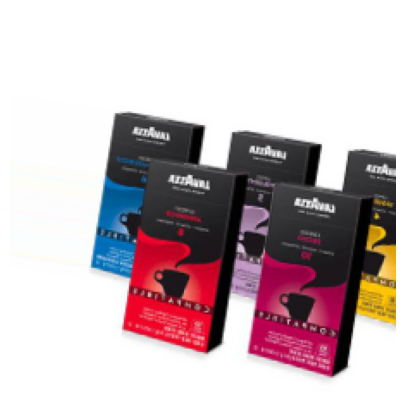

In [ ]:
x = np.expand_dims(XV2_test[230], axis=0)  # Expand dimension for image
y = np.expand_dims(tf.keras.utils.to_categorical(1, 6), axis=0)

plt.rcParams["figure.figsize"] = [12.5, 5]
plt.imshow(x[0])
plt.axis('off')
plt.show()

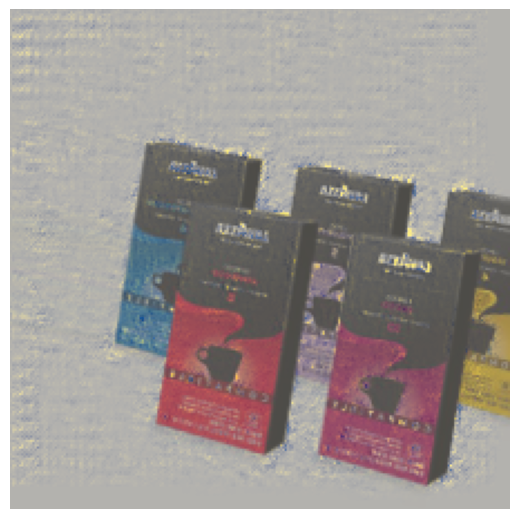

In [ ]:
# instanciate explainer with arbitrary parameters
explainer = IntegratedGradients(model_2,
                                output_layer=-2, batch_size=16,
                                steps=50, baseline_value=0)

# compute explanation by calling the explainer
explanation = explainer.explain(x, y)

# visualize explanation with plot_explanation() function
plot_attributions(explanation, x, img_size=5, cmap='cividis', cols=1, alpha=0.6)

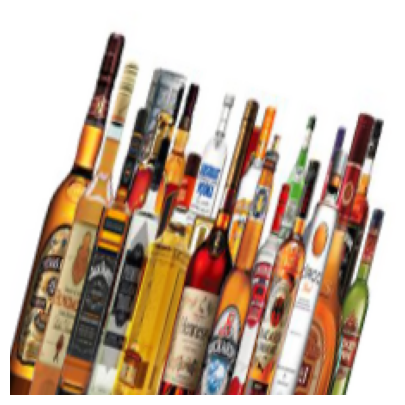

In [ ]:
x = np.expand_dims(XV2_test[240], axis=0)  # Expand dimension for image
y = np.expand_dims(tf.keras.utils.to_categorical(1, 6), axis=0)

plt.rcParams["figure.figsize"] = [12.5, 5]
plt.imshow(x[0])
plt.axis('off')
plt.show()

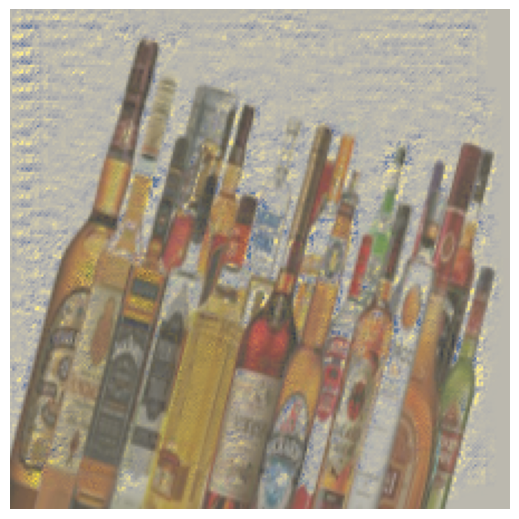

In [ ]:
# instanciate explainer with arbitrary parameters
explainer = IntegratedGradients(model_2,
                                output_layer=-2, batch_size=16,
                                steps=200, baseline_value=0.3)

# compute explanation by calling the explainer
explanation = explainer.explain(x, y)

# visualize explanation with plot_explanation() function
plot_attributions(explanation, x, img_size=5, cmap='cividis', cols=1, alpha=0.6)

## SHAP method

In [ ]:
preds = model_2.predict(XV2_test)

# Convert predicted probabilities to class labels
y_pred_labels = np.argmax(preds, axis=1)
# Convert one-hot encoded true labels to class labels
y_true_labels = np.argmax(yV2_test, axis=1)

# Extract wrongly classified and correctly classified images
wrongly_classified_images = []
correctly_classified_images = []

for i in range(len(y_true_labels)):
    if y_pred_labels[i] != y_true_labels[i]:
        # Image is wrongly classified
        wrongly_classified_images.append(XV2_test[i])
    else:
        # Image is correctly classified
        correctly_classified_images.append(XV2_test[i])

# Convert lists to numpy arrays
wrongly_classified_images = np.array(wrongly_classified_images)
correctly_classified_images = np.array(correctly_classified_images)

# Print the number of wrongly classified and correctly classified images
print("Number of wrongly classified images:", len(wrongly_classified_images))
print("Number of correctly classified images:", len(correctly_classified_images))

14/14 [==============================] - 1s 55ms/step
Number of wrongly classified images: 152
Number of correctly classified images: 276


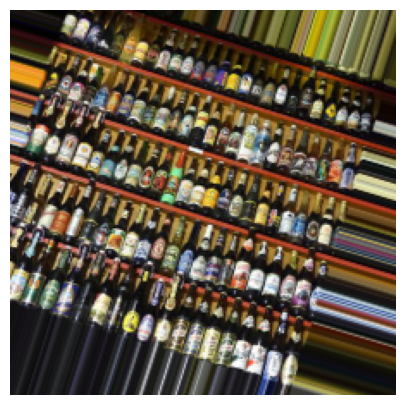

In [ ]:
x = np.expand_dims(XV2_test[300], axis=0)  # Expand dimension for image
y = np.expand_dims(tf.keras.utils.to_categorical(1, 6), axis=0)

plt.rcParams["figure.figsize"] = [12.5, 5]
plt.imshow(x[0])
plt.axis('off')
plt.show()

KernelShap


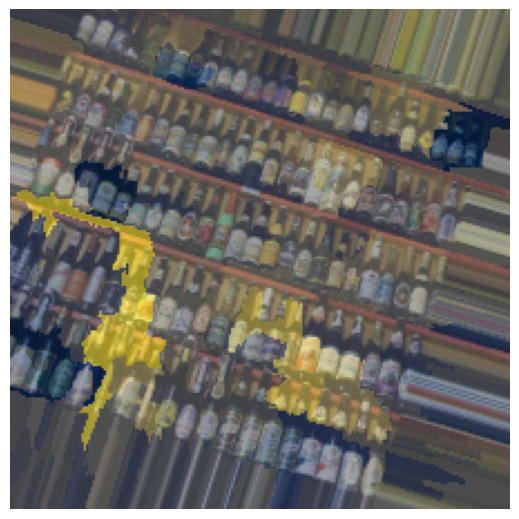

In [ ]:
# define arbitrary parameters
common_parameters = {
    "model": model_2,
    "batch_size": 16,
    "map_to_interpret_space": lambda inp: tf.cast(slic(inp.numpy().astype('double'), n_segments=500, compactness=1, sigma=1, start_label=1), tf.int32),  # will use the slic function
    "nb_samples": 4000,
    "ref_value": None,  # default value  will use (0.5, 0.5, 0.5) for images

}

# instanciate one explainer for each method
explainer = {
    "KernelShap": KernelShap(**common_parameters),
}

# iterate on all methods
for method_name, explainer in explainer.items():
    # compute explanation by calling the explainer
    explanation = explainer.explain(x, y)

    # visualize explanation with plot_explanation() function
    print(method_name)
    plot_attributions(explanation, x, img_size=5, cmap='cividis', cols=1, alpha=0.6)
    plt.show()

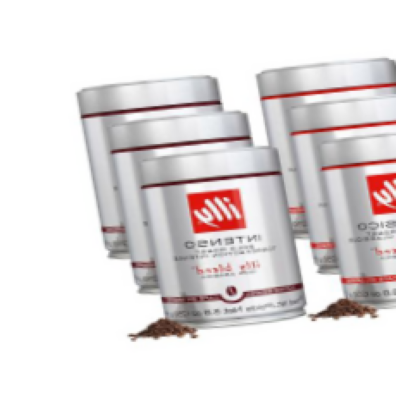

In [ ]:
x = np.expand_dims(XV2_test[375], axis=0)  # Expand dimension for image
y = np.expand_dims(tf.keras.utils.to_categorical(1, 6), axis=0)

plt.rcParams["figure.figsize"] = [12.5, 5]
plt.imshow(x[0])
plt.axis('off')
plt.show()

KernelShap


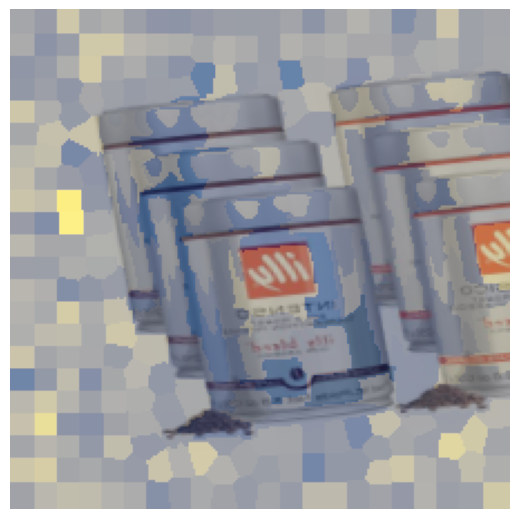

In [ ]:
# define arbitrary parameters
common_parameters = {
    "model": model_2,
    "batch_size": 16,
    "map_to_interpret_space": lambda inp: tf.cast(slic(inp.numpy().astype('double'), n_segments=500, compactness=1, sigma=1, start_label=1), tf.int32),  # will use the slic function
    "nb_samples": 4000,
    "ref_value": None,  # default value  will use (0.5, 0.5, 0.5) for images

}

# instanciate one explainer for each method
explainer = {
    "KernelShap": KernelShap(**common_parameters),
}

# iterate on all methods
for method_name, explainer in explainer.items():
    # compute explanation by calling the explainer
    explanation = explainer.explain(x, y)

    # visualize explanation with plot_explanation() function
    print(method_name)
    plot_attributions(explanation, x, img_size=5, cmap='cividis', cols=1, alpha=0.6)
    plt.show()

For the alcoholic beverages category: Based on the Integrated Gradients and SHAP explanations, it can be concluded that the model uses bottle shape and colour as features to categorize inputs.

For coffe grounds: Based on the Integrated Gradients and SHARP explanations, it can be concluded that the model uses the shape of packaging, symbols such as coffee cups on the packaging, and key words such as 'Lavazza' as features to categorize inputs. However, as the SHAP explanations show, the model is not able to explain the difference between the two types of coffee grounds. It incorrectly puts high importance on irrelevant superpixels, such as background colour changes. This could explain why this cattegory is one of the most missclassified (based on Error Analysis in 3.6), as well as these specific set of images (cans of ILLY coffee grounds).

# Section 3 - Neural Networks and Deep Learning (Weeks 2 to 5)

## Task 3.1: Baselines

### 1. Random Guess Accuracy

In [ ]:
# Folder paths where the images of each class are stored
folder_paths = [
    "dataset_copy/alcoholic_beverages_bottle",
    "dataset_copy/non-alcoholic_beverages_bottle",
    "dataset_copy/non-alcoholic_beverages",
    "dataset_copy/lemon_lime",
    "dataset_copy/cocktail_fruits",
    "dataset_copy/coffee_grounds_package",

]

# Class labels for the images (same order as folder_paths)
class_names = [
    "alcoholic_beverages_bottle", 
    "non-alcoholic_beverages_bottle",
    "non-alcoholic_beverages",
    "lemon_lime",
    "cocktail_fruits",
    "coffee_grounds_package"
]

# Target size to resize the images
target_size = (64, 64)

# Arrays to store the images (X) and class labels (y)
X = []
y = []

for i in range(len(folder_paths)):
    for filename in os.listdir(folder_paths[i]):
        file_extension = os.path.splitext(filename)[1]
        # Check if the file extension is an image extension 
        if file_extension == ".jpg" or file_extension == ".jpeg" or file_extension == ".png": 
            image_filename = os.path.join(folder_paths[i], filename)
            # Read the image file using scikit-image
            image = ski.io.imread(image_filename)
            # Normalize the image to values between 0 and 1
            image = image / 255.0
            # Resize the image to the target_size
            image_resized = ski.transform.resize(image, target_size)            
            # Insert the image into array X
            X.append(image_resized)
            # Insert the class label into array y
            y.append(class_names[i])
            
# Convert of arrays into numpy arrays
X = np.array(X)
y = np.array(y)

In [143]:
# Assuming y contains the labels of your dataset
unique_classes, class_counts = np.unique(y, return_counts=True)

# Find the majority class
majority_class_index = np.argmax(class_counts)
majority_class_count = class_counts[majority_class_index]

# Calculate the baseline accuracy
baseline_accuracy = majority_class_count / len(y)
print("Random Guess Accuracy:", baseline_accuracy)

Random Guess Accuracy: 0.3637640449438202


### 2. Human-Level Performance Accuracy

This is the link to the form for collecting responses:
[https://forms.office.com/Pages/ResponsePage.aspx?id=m1gzCjYA6E-oKT7Qkmr4hooJpkXYSdxCrNsVf6YdVkBUNllVOTFHMU80OFVVMkJXRVdHREVMVFpOMy4u]

In [124]:
#HLP accuracy alcoholic_beverages_bottle
corr_class = 5 + 5 + 5 + 5 + 3 + 5 + 5 + 5 + 4 
total_inst = 5 * 9
hlp = (corr_class/total_inst) * 100
print('HLP alcoholic_beverages_bottle =',hlp)

HLP alcoholic_beverages_bottle = 93.33333333333333


In [125]:
#HLP accuracy cocktail_fruits
corr_class = 5 + 5 + 5 + 5 + 5 + 4 + 5 + 4 + 5 + 5 
total_inst = 5 * 10
hlp = (corr_class/total_inst) * 100
print('HLP cocktail_fruits =',hlp)

HLP cocktail_fruits = 96.0


In [126]:
#HLP accuracy coffee_grounds_package
corr_class = 5 + 5 + 5 + 5 + 5 + 5 + 4 + 5 + 5 + 5 
total_inst = 5 * 10
hlp = (corr_class/total_inst) * 100
print('HLP coffee_grounds_package =',hlp)

HLP coffee_grounds_package = 98.0


In [127]:
#HLP accuracy lemon_lime
corr_class = 5 + 5 + 5 + 5 + 5 + 5 + 5 + 5 + 5 + 5
total_inst = 5 * 10
hlp = (corr_class/total_inst) * 100
print('HLP lemon_lime =',hlp)

HLP lemon_lime = 100.0


In [131]:
#HLP accuracy non-alcoholic_beverages
corr_class = 5 + 5 + 5 + 5 + 5 + 5 + 5 + 4 + 5
total_inst = 5 * 9
hlp = (corr_class/total_inst) * 100
print('HLP non-alcoholic_beverages =',hlp)

HLP non-alcoholic_beverages = 97.77777777777777


In [46]:
#HLP accuracy non-alcoholic_beverages_bottle
corr_class = 3 + 5
total_inst = 5 * 2
hlp = (corr_class/total_inst) * 100
print('HLP non-alcoholic_beverages_bottle =',hlp)

HLP non-alcoholic_beverages_bottle = 80.0


### 3. Basic Multilayer Perceptron Accuracy

I first loaded the images from my dataset and converted them into NumPy arrays. I then resized the images to have uniformity in the image sized, as well as to reduce processing time. I normalized the images to be between 0 and 1. The next step was encoding the images to convert categorical target variables into binary, which can be easily handled by neural networks and other machine learning algorithms.
The model was then trained and tested, first with an initial learning rate, then tested with different values. 
I then trained and evaluate the baseline MLP model with different learning rates.

In [170]:
# Folder paths where the images of each class are stored
folder_paths = [
    "dataset_copy/alcoholic_beverages_bottle",
    "dataset_copy/non-alcoholic_beverages_bottle",
    "dataset_copy/non-alcoholic_beverages",
    "dataset_copy/lemon_lime",
    "dataset_copy/cocktail_fruits",
    "dataset_copy/coffee_grounds_package",

]

# Class labels for the images (same order as folder_paths)
class_names = [
    "alcoholic_beverages_bottle", 
    "non-alcoholic_beverages_bottle",
    "non-alcoholic_beverages",
    "lemon_lime",
    "cocktail_fruits",
    "coffee_grounds_package"
]

# Target size to resize the images
target_size = (64, 64)

# Arrays to store the images (X) and class labels (y)
X = []
y = []

for i in range(len(folder_paths)):
    for filename in os.listdir(folder_paths[i]):
        file_extension = os.path.splitext(filename)[1]
        # Check if the file extension is an image extension 
        if file_extension == ".jpg" or file_extension == ".jpeg" or file_extension == ".png": 
            image_filename = os.path.join(folder_paths[i], filename)
            # Read the image file using scikit-image
            image = ski.io.imread(image_filename)
            # Normalize the image to values between 0 and 1
            image = image / 255.0
            # Resize the image to the target_size
            image_resized = ski.transform.resize(image, target_size)            
            # Insert the image into array X
            X.append(image_resized)
            # Insert the class label into array y
            y.append(class_names[i])
            
# Convert of arrays into numpy arrays
X = np.array(X)
y = np.array(y)

In [147]:
# Print out the shape of the arrays
X.shape, y.shape

((712, 64, 64, 3), (712,))

- Before encoding the images, I first converted the categorical variables into integers.

In [171]:
# Encode the class labels into integers
label_encoder = LabelEncoder()
y_integer_encoded = label_encoder.fit_transform(y)

print(len(y_integer_encoded))

712


In [172]:
num_classes = len(np.unique(y_integer_encoded))

y_onehot_encoded = keras.utils.to_categorical(y_integer_encoded, num_classes=num_classes)
print(y_onehot_encoded)

[[1. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 1. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0.]]


In [173]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y_onehot_encoded,
                                                    test_size=0.33,
                                                    random_state=0)

In [174]:
# Print out the shape of the arrays
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((477, 64, 64, 3), (235, 64, 64, 3), (477, 6), (235, 6))

In [175]:
# Split the dataset into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train,
                                                  y_train,
                                                  test_size=0.2,
                                                  random_state=0)

In [176]:
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((381, 64, 64, 3), (96, 64, 64, 3), (381, 6), (96, 6))

In [177]:
# Reshape the input data to a 2D array of 64x64 pixels x 3 channels (12.288 pixels)
X_train = X_train.reshape(-1, 12288)
X_test = X_test.reshape(-1, 12288)
X_val = X_val.reshape(-1, 12288)

In [178]:
# Create a sequential model
model = Sequential()
  
# Add 3 dense layers of 128, 64 and 32 neurons each
model.add(Dense(128, input_shape=(12288,), activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(32, activation='relu'))
  
# Add a dense layer
model.add(Dense(6, activation='softmax'))

# Compile your model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train your model
history_no_earlystopping = model.fit(X_train, y_train, epochs=20, validation_data=(X_val, y_val))

Epoch 1/20
12/12 [==============================] - 0s 10ms/step - loss: 0.8465 - accuracy: 0.1811 - val_loss: 0.5885 - val_accuracy: 0.2188
Epoch 2/20
12/12 [==============================] - 0s 5ms/step - loss: 0.5006 - accuracy: 0.2677 - val_loss: 0.4810 - val_accuracy: 0.3646
Epoch 3/20
12/12 [==============================] - 0s 5ms/step - loss: 0.4527 - accuracy: 0.3648 - val_loss: 0.4624 - val_accuracy: 0.3125
Epoch 4/20
12/12 [==============================] - 0s 5ms/step - loss: 0.4308 - accuracy: 0.3911 - val_loss: 0.4361 - val_accuracy: 0.4583
Epoch 5/20
12/12 [==============================] - 0s 5ms/step - loss: 0.3961 - accuracy: 0.4829 - val_loss: 0.4463 - val_accuracy: 0.3333
Epoch 6/20
12/12 [==============================] - 0s 5ms/step - loss: 0.3742 - accuracy: 0.4882 - val_loss: 0.4761 - val_accuracy: 0.3333
Epoch 7/20
12/12 [==============================] - 0s 5ms/step - loss: 0.3716 - accuracy: 0.5066 - val_loss: 0.4096 - val_accuracy: 0.3854
Epoch 8/20


12/12 [==============================] - 0s 6ms/step - loss: 0.3343 - accuracy: 0.5827 - val_loss: 0.4170 - val_accuracy: 0.4583
Epoch 9/20
12/12 [==============================] - 0s 5ms/step - loss: 0.3526 - accuracy: 0.5591 - val_loss: 0.4806 - val_accuracy: 0.3125
Epoch 10/20
12/12 [==============================] - 0s 5ms/step - loss: 0.3539 - accuracy: 0.5459 - val_loss: 0.5036 - val_accuracy: 0.3333
Epoch 11/20
12/12 [==============================] - 0s 5ms/step - loss: 0.3236 - accuracy: 0.5932 - val_loss: 0.3859 - val_accuracy: 0.4479
Epoch 12/20
12/12 [==============================] - 0s 5ms/step - loss: 0.2899 - accuracy: 0.6824 - val_loss: 0.4128 - val_accuracy: 0.4271
Epoch 13/20
12/12 [==============================] - 0s 5ms/step - loss: 0.2876 - accuracy: 0.6903 - val_loss: 0.3921 - val_accuracy: 0.4375
Epoch 14/20
12/12 [==============================] - 0s 8ms/step - loss: 0.2831 - accuracy: 0.6667 - val_loss: 0.4142 - val_accuracy: 0.4479
Epoch 15/20
12/12 [=======

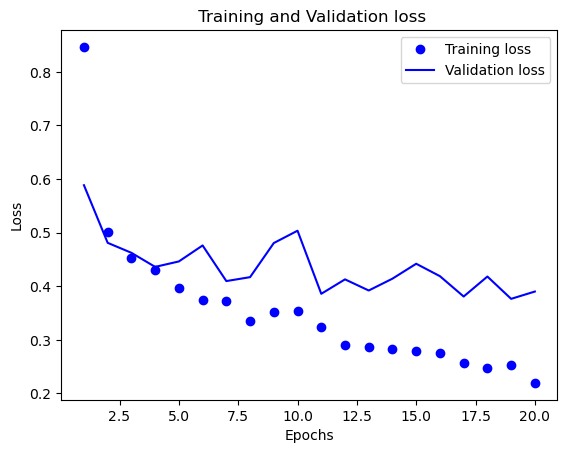

In [179]:
# Plot the training and validation loss
loss = history_no_earlystopping.history['loss']
val_loss = history_no_earlystopping.history['val_loss']
epochs = range (1, len(loss) + 1)
plt.plot (epochs, loss, 'bo', label = 'Training loss')
plt.plot (epochs, val_loss, 'b', label = 'Validation loss')
plt.title(' Training and Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

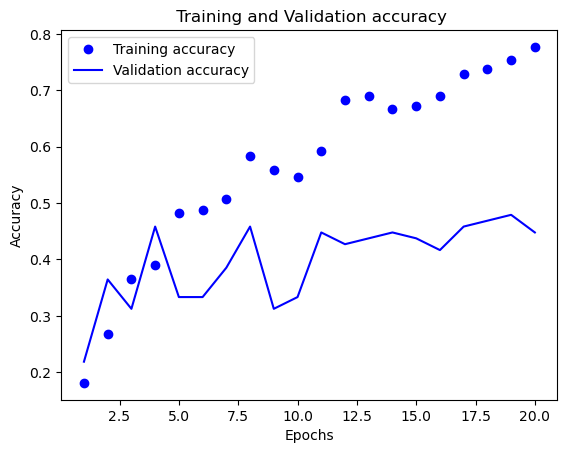

In [180]:
# Plot the training and validation accuracy
acc = history_no_earlystopping.history['accuracy']
val_acc = history_no_earlystopping.history['val_accuracy']
epochs = range (1, len(loss) + 1)
plt.plot (epochs, acc, 'bo', label = 'Training accuracy')
plt.plot (epochs, val_acc, 'b', label = 'Validation accuracy')
plt.title(' Training and Validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [181]:
# Define a callback to monitor val_accuracy
monitor_val_acc = EarlyStopping(monitor='val_accuracy', 
                       patience=5)

# Train your model using the early stopping callback
history_earlystopping = model.fit(X_train, y_train, 
           epochs=1000,
           callbacks= [monitor_val_acc], validation_data=(X_val, y_val))

Epoch 1/1000
12/12 [==============================] - 0s 6ms/step - loss: 0.2217 - accuracy: 0.7953 - val_loss: 0.4055 - val_accuracy: 0.4583
Epoch 2/1000
12/12 [==============================] - 0s 5ms/step - loss: 0.2585 - accuracy: 0.7165 - val_loss: 0.5038 - val_accuracy: 0.4479
Epoch 3/1000
12/12 [==============================] - 0s 5ms/step - loss: 0.2185 - accuracy: 0.7638 - val_loss: 0.4298 - val_accuracy: 0.4688
Epoch 4/1000
12/12 [==============================] - 0s 5ms/step - loss: 0.2039 - accuracy: 0.8163 - val_loss: 0.4158 - val_accuracy: 0.4896
Epoch 5/1000
12/12 [==============================] - 0s 5ms/step - loss: 0.1998 - accuracy: 0.8031 - val_loss: 0.4354 - val_accuracy: 0.4792
Epoch 6/1000
12/12 [==============================] - 0s 5ms/step - loss: 0.1790 - accuracy: 0.8346 - val_loss: 0.3841 - val_accuracy: 0.4792
Epoch 7/1000
12/12 [==============================] - 0s 5ms/step - loss: 0.1697 - accuracy: 0.8451 - val_loss: 0.3780 - val_accuracy: 0.4583
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 0.1356 - accuracy: 0.8950 - val_loss: 0.4309 - val_accuracy: 0.4479
Epoch 14/1000
12/12 [==============================] - 0s 6ms/step - loss: 0.1248 - accuracy: 0.9186 - val_loss: 0.3747 - val_accuracy: 0.5000


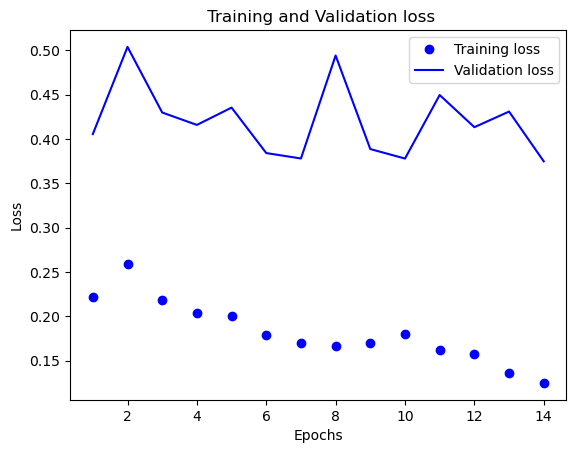

In [182]:
# Plot the training and validation loss
loss = history_earlystopping.history['loss']
val_loss = history_earlystopping.history['val_loss']
epochs = range (1, len(loss) + 1)
plt.plot (epochs, loss, 'bo', label = 'Training loss')
plt.plot (epochs, val_loss, 'b', label = 'Validation loss')
plt.title(' Training and Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

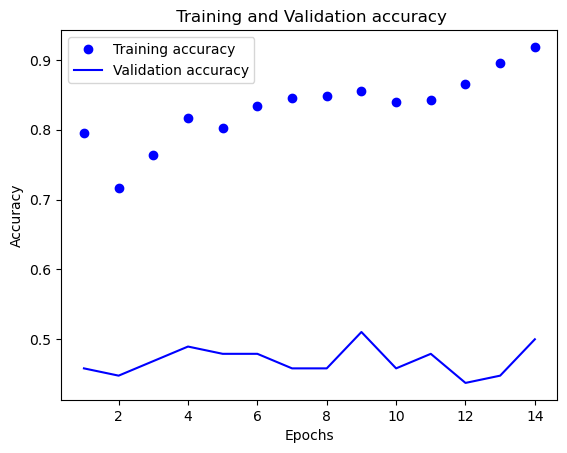

In [183]:
# Plot the training and validation accuracy
acc = history_earlystopping.history['accuracy']
val_acc = history_earlystopping.history['val_accuracy']
epochs = range (1, len(loss) + 1)
plt.plot (epochs, acc, 'bo', label = 'Training accuracy')
plt.plot (epochs, val_acc, 'b', label = 'Validation accuracy')
plt.title(' Training and Validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [184]:
# Calculate the baseline accuracy 
accuracy = model.evaluate(X_test, y_test)[1]

# Print accuracy
print('Accuracy:', accuracy)

8/8 [==============================] - 0s 2ms/step - loss: 0.3605 - accuracy: 0.5915
Accuracy: 0.5914893746376038


In [185]:
# Define a function to train and evaluate MLP with different learning rates
def train_evaluate_mlp(learning_rate, X_train, X_test, y_train, y_test):
    
    # Initialize classifier with specified learning rate
    model = Sequential()
  
    # Add 3 dense layers of 128, 64 and 32 neurons each
    model.add(Dense(128, input_shape=(12288,), activation='relu'))
    model.add(Dense(64, activation='relu'))
    model.add(Dense(32, activation='relu'))
  
    # Add a dense layer with as many neurons as competitors
    model.add(Dense(6, activation='softmax'))

    # Compile your model
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

    # Train your model
    model.fit(X_train, y_train, epochs=20)
    
    # Calculate accuracy
    accuracy = model.evaluate(X_test, y_test)[1]
    
    return accuracy

In [186]:
# Learning rates to be used
learning_rates = [0.1, 0.001, 0.01, 0.1]

In [187]:
# Define an empty dictionary to store accuracies for different learning rates
accuracy_dict = {}

# Iterate over different learning rates
for lr in learning_rates:
    accuracy = train_evaluate_mlp(lr, X_train, X_test, y_train, y_test)
    accuracy_dict[lr] = accuracy
    print(f'Accuracy with learning rate {lr}: {accuracy}')

# Print all accuracies
for lr, accuracy in accuracy_dict.items():
    print(f'Accuracy with learning rate {lr}: {accuracy}')

Epoch 1/20
12/12 [==============================] - 0s 3ms/step - loss: 0.7366 - accuracy: 0.2940
Epoch 2/20
12/12 [==============================] - 0s 3ms/step - loss: 0.5057 - accuracy: 0.2625
Epoch 3/20
12/12 [==============================] - 0s 3ms/step - loss: 0.4564 - accuracy: 0.2966
Epoch 4/20
12/12 [==============================] - 0s 4ms/step - loss: 0.4235 - accuracy: 0.3780
Epoch 5/20
12/12 [==============================] - 0s 3ms/step - loss: 0.3969 - accuracy: 0.4331
Epoch 6/20
12/12 [==============================] - 0s 4ms/step - loss: 0.3819 - accuracy: 0.4724
Epoch 7/20
12/12 [==============================] - 0s 3ms/step - loss: 0.3541 - accuracy: 0.5696
Epoch 8/20
12/12 [==============================] - 0s 3ms/step - loss: 0.3489 - accuracy: 0.5354
Epoch 9/20
12/12 [==============================] - 0s 3ms/step - loss: 0.3347 - accuracy: 0.5748
Epoch 10/20
12/12 [==============================] - 0s 3ms/step - loss: 0.3351 - accuracy: 0.5932
Epoch 11/20
12/12 [

12/12 [==============================] - 0s 4ms/step - loss: 0.2776 - accuracy: 0.6667
Epoch 15/20
12/12 [==============================] - 0s 4ms/step - loss: 0.2652 - accuracy: 0.7008
Epoch 16/20
12/12 [==============================] - 0s 3ms/step - loss: 0.2494 - accuracy: 0.7533
Epoch 17/20
12/12 [==============================] - 0s 3ms/step - loss: 0.2351 - accuracy: 0.7559
Epoch 18/20
12/12 [==============================] - 0s 4ms/step - loss: 0.2229 - accuracy: 0.7559
Epoch 19/20
12/12 [==============================] - 0s 3ms/step - loss: 0.2264 - accuracy: 0.7900
Epoch 20/20
8/8 [==============================] - 0s 1ms/step - loss: 0.3077 - accuracy: 0.6426
Accuracy with learning rate 0.1: 0.6425532102584839
Epoch 1/20
12/12 [==============================] - 0s 3ms/step - loss: 0.7516 - accuracy: 0.2703
Epoch 2/20
12/12 [==============================] - 0s 4ms/step - loss: 0.5006 - accuracy: 0.2257
Epoch 3/20
12/12 [==============================] - 0s 3ms/step - loss: 0

## Task 3.2 Preprocessing

### Iteration 1

**Basic preprocessing techniques (also used in Task 3.1)**

As part of the preprocessing stage, I have also manually checked all images and deleted the ones classified wrongly.

_Resizing the dataset images_

In [2]:
# Folder paths where the images of each class are stored
folder_paths = [
    "dataset_copy/alcoholic_beverages_bottle",
    "dataset_copy/non-alcoholic_beverages_bottle",
    "dataset_copy/non-alcoholic_beverages",
    "dataset_copy/lemon_lime",
    "dataset_copy/cocktail_fruits",
    "dataset_copy/coffee_grounds_package",

]

# Class labels for the images (same order as folder_paths)
class_names = [
    "alcoholic_beverages_bottle", 
    "non-alcoholic_beverages_bottle",
    "non-alcoholic_beverages",
    "lemon_lime",
    "cocktail_fruits",
    "coffee_grounds_package"
]

# Target size to resize the images
target_size = (224, 224)

# Arrays to store the images (X) and class labels (y)
XV1 = []
yV1 = []

In [3]:
for i in range(len(folder_paths)):
    for filename in os.listdir(folder_paths[i]):
        file_extension = os.path.splitext(filename)[1]
        # Check if the file extension is an image extension 
        if file_extension == ".jpg" or file_extension == ".jpeg" or file_extension == ".png": 
            image_filename = os.path.join(folder_paths[i], filename)
            # Read the image file using scikit-image
            image = ski.io.imread(image_filename)
            # Normalize the image to values between 0 and 1
            # image = image / 255.0                     # No normalisation as the VGG16 models accepts as input images with pixel values in the range [0, 255]
            # Resize the image to the target_size
            image_resized = ski.transform.resize(image, target_size)            
            # Insert the image into array X
            XV1.append(image_resized)
            # Insert the class label into array y
            yV1.append(class_names[i])

In [4]:
# Convert of arrays into numpy arrays
XV1 = np.array(XV1)
yV1 = np.array(yV1)

_Label Encoding and One-hot encoding the images_

In [5]:
# Encode the class labels into integers
label_encoder = LabelEncoder()
y_integer_encoded_v1 = label_encoder.fit_transform(yV1)

print(len(y_integer_encoded_v1))

712


In [6]:
num_classes = len(np.unique(y_integer_encoded_v1))

y_onehot_encoded_v1 = keras.utils.to_categorical(y_integer_encoded_v1, num_classes=num_classes)
print(y_onehot_encoded_v1)

[[1. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 1. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0.]]


_Train-Validation-Test split_

In [7]:
# Split the dataset into training and testing sets
XV1_train, XV1_test, yV1_train, yV1_test = train_test_split(XV1,
                                                    y_onehot_encoded_v1,
                                                    test_size=1/10,
                                                    random_state=0)

In [10]:
print(XV1_train.shape, XV1_test.shape, yV1_train.shape, yV1_test.shape)

(640, 224, 224, 3) (72, 224, 224, 3) (640, 6) (72, 6)


In [8]:
# Split the dataset into training and validation sets
XV1_train, XV1_val, yV1_train, yV1_val = train_test_split(XV1_train,
                                                  yV1_train,
                                                  test_size = 1/9,
                                                  random_state = 0)
                                                  
print(XV1_train.shape, XV1_val.shape, XV1_test.shape)

(568, 224, 224, 3) (72, 224, 224, 3) (72, 224, 224, 3)


### Iteration 2

**Data Augmentation**

In this iteration, I did not apply normalization in order to rely on the raw dataset as much as possible and observe the model. 

In [9]:
# Folder paths where the images of each class are stored
folder_paths = [
    "dataset_copy/alcoholic_beverages_bottle",
    "dataset_copy/non-alcoholic_beverages_bottle",
    "dataset_copy/non-alcoholic_beverages",
    "dataset_copy/lemon_lime",
    "dataset_copy/cocktail_fruits",
    "dataset_copy/coffee_grounds_package",

]

# Class labels for the images (same order as folder_paths)
class_names = [
    "alcoholic_beverages_bottle", 
    "non-alcoholic_beverages_bottle",
    "non-alcoholic_beverages",
    "lemon_lime",
    "cocktail_fruits",
    "coffee_grounds_package"
]

# Target size to resize the images
target_size = (224, 224)

# Arrays to store the images (X) and class labels (y)
XV2 = []
yV2 = []

for i in range(len(folder_paths)):
    for filename in os.listdir(folder_paths[i]):
        file_extension = os.path.splitext(filename)[1]
        # Check if the file extension is an image extension 
        if file_extension == ".jpg" or file_extension == ".jpeg" or file_extension == ".png": 
            image_filename = os.path.join(folder_paths[i], filename)
            # Read the image file using scikit-image
            image = ski.io.imread(image_filename)
            # Normalize the image to values between 0 and 1
            # image = image / 255.0
            # Resize the image to the target_size
            image_resized = ski.transform.resize(image, target_size)
            if image_resized.shape == (224, 224, 3): 
                XV2.append(image_resized)
                yV2.append(class_names[i])          

# Convert of arrays into numpy arrays
XV2 = np.array(XV2)
yV2 = np.array(yV2)

I used data augmentation techniques such as rotating the image, shifting the width and height, flipping it, and zooming.

In order to use the data generator to create new images, we can use method $flow$, which takes data and generates batches of augmented data. To simplify the process of using the $flow$ method, we can create our own function where we can define how many images we want to generate:

In [10]:
data_gen = ImageDataGenerator(rotation_range=30,
                             width_shift_range=0.2,
                             height_shift_range=0.2,
                             horizontal_flip=True,
                             zoom_range=0.2)

In [11]:
def GenerateImages(generator, image, num_images):
    new_images = []
    # we need to reshape the image because the generator.flow() 
    # expects an array of images
    image = np.reshape(image, (1,) + image.shape)
    for _ in range(num_images):
        batch = next(generator.flow(image, batch_size=1))
        new_images.append(batch[0])
    return np.array(new_images)

In [12]:
# Save the images to a new dataset 'X_augmented' and 'y_augmented'
X_augmented = []
y_augmented = []
for index in range(len(XV2)):
    images = GenerateImages(data_gen, XV2[index], 6)
    for i in range(6):
        X_augmented.append(images[i])
        y_augmented.append(yV2[index])

# Convert lists to numpy arrays
X_augmented = np.array(X_augmented)
y_augmented = np.array(y_augmented)

In [13]:
# Encode the class labels into integers
label_encoder = LabelEncoder()
y_integer_encoded_v2 = label_encoder.fit_transform(y_augmented)
num_classes = len(np.unique(y_integer_encoded_v2))
y_onehot_encoded_v2 = keras.utils.to_categorical(y_integer_encoded_v2, num_classes=num_classes)

In [14]:
# Split the dataset into training and testing sets
XV2_train, XV2_test, yV2_train, yV2_test = train_test_split(X_augmented,
                                                    y_onehot_encoded_v2,
                                                    test_size=1/10,
                                                    random_state=0)

# Split the dataset into training and validation sets
XV2_train, XV2_val, yV2_train, yV2_val = train_test_split(XV2_train,
                                                  yV2_train,
                                                  test_size = 1/9,
                                                  random_state = 0)

In [18]:
print(XV2_train.shape, XV2_test.shape, yV2_train.shape, yV2_test.shape)

(3416, 224, 224, 3) (428, 224, 224, 3) (3416, 6) (428, 6)


In [19]:
print(XV2_train.shape, XV2_val.shape, XV2_test.shape)

(3416, 224, 224, 3) (428, 224, 224, 3) (428, 224, 224, 3)


### Iteration 3

In this iteration I will be using the preprocessed dataset ad in the first one. However, instead of a simple convolutional neural network , it will be applied to the VGG16-based model.

### Iteration 4

In this iteration I will be using the augmentated dataset ad in the second iteration. However, instead of a simple convolutional neural network , it will be applied to the VGG16-based model.

### _Conclusion_

I experimented with different preprocessed versions of the dataset (smaller target size, normalising vs not normalising the input pixels, kernel sizes , etc), which led tme to the following conclusion:

Due to the restricting input shape of the VGG16 model (224, 224, 3), the kernel size for the simple CNN model had to be adjusted from 2 to 3, to maintain compatibility. Padding had to be set to ‘same’, ensuring that the convolution operation adds padding to the input feature map as necessary to produce an output feature map of the same spatial dimensions. On the contrary, due to normalisation techniques drastically and negatively affecting the VGG16-based model’s performance, causing it to overfit almost instantly, I had to sacrifice applying this preprocessing technique, which had an impact on the simple CNN model, leading to overfitting.

## Task 3.3 CNN Architecture

### Iteration 1

Simple CNN model which willl be trained using the dataset where basic preprocessing techniques have been applied.

In [116]:
# Create a sequential model
model_1 = Sequential()

# Add convolutional layers, max pooling, and dropout layers
model_1.add(Conv2D(10, kernel_size=3, activation='relu', input_shape=target_size + (3,), padding='same'))
model_1.add(MaxPooling2D(pool_size=(2, 2)))
model_1.add(Conv2D(10, kernel_size=3, activation='relu'))
model_1.add(MaxPooling2D(pool_size=(2, 2)))
model_1.add(Conv2D(10, kernel_size=3, activation='relu'))
model_1.add(MaxPooling2D(pool_size=(2, 2)))
model_1.add(Flatten())

# Output layer
model_1.add(Dense(6, activation='softmax'))

# Compile the model
model_1.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Summarize the model
model_1.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 224, 224, 10)      280       
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 112, 112, 10)     0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 110, 110, 10)      910       
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 55, 55, 10)       0         
 g2D)                                                            
                                                                 
 conv2d_11 (Conv2D)          (None, 53, 53, 10)        910       
                                                                 
 max_pooling2d_11 (MaxPoolin  (None, 26, 26, 10)      

### Iteration 2

For this iteration, I used the same CNN architecture, only it will be trained using the augmented dataset.

In [15]:
# Create a sequential model
model_2 = Sequential()

# Add convolutional layers, max pooling, and dropout layers
model_2.add(Conv2D(10, kernel_size=3, activation='relu', input_shape=target_size + (3,), padding='same'))
model_2.add(MaxPooling2D(pool_size=(2, 2)))
model_2.add(Conv2D(10, kernel_size=3, activation='relu'))
model_2.add(MaxPooling2D(pool_size=(2, 2)))
model_2.add(Conv2D(10, kernel_size=3, activation='relu'))
model_2.add(MaxPooling2D(pool_size=(2, 2)))
model_2.add(Flatten())

# Output layer
model_2.add(Dense(6, activation='softmax'))

# Compile the model
model_2.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Summarize the model
model_2.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 10)      280       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 112, 112, 10)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 110, 110, 10)      910       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 55, 55, 10)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 53, 53, 10)        910       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 26, 26, 10)       0

### Iteration 3

I have used a transfer learning approach utilizing the VGG16 model, implemented for a multi-class image classification task. VGG16 is renowned for its effectiveness in various computer vision tasks, which is the main reason I decided to use it. The VGG16 model was imported from Keras with pre-trained weights, excluding its top (fully connected) layers. 

The weights of the pre-trained layers were frozen to retain the learned features, while the newly added layers were trainable. The model was compiled with the Adam optimizer and categorical cross-entropy loss function, suitable for one-hot encoded class labels. 

This pre-trained model was then augmented with additional layers, including a flattening layer to convert 3D feature maps to 1D vectors, dense layers, a dropout layer, and an output layer. 

In [22]:
# Load pre-trained VGG16 model without including the top layers
vgg_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

In [23]:
# Freeze the weights of the pre-trained layers
for layer in vgg_model.layers:
    layer.trainable = False

In [24]:
# Create a new model
model_3 = Sequential()

# Add the pre-trained VGG16 model
model_3.add(vgg_model)

# Add Dense, Dropout and Flatten layers
model_3.add(Flatten(input_shape=(224, 224, 3)))
model_3.add(Dense(256, activation='relu'))
model_3.add(Dense(128, activation='relu'))
model_3.add(Dropout(rate=0.5))
model_3.add(Dense(6, activation='softmax'))

# Compile the model
model_3.compile(optimizer=Adam(lr=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Architectures of the model
model_3.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten_2 (Flatten)         (None, 25088)             0         
                                                                 
 dense_2 (Dense)             (None, 256)               6422784   
                                                                 
 dense_3 (Dense)             (None, 128)               32896     
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_4 (Dense)             (None, 6)                 774       
                                                                 
Total params: 21,171,142
Trainable params: 6,456,454
N

/Users/daria/anaconda3/envs/block_c/lib/python3.11/site-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


### Iteration 4

This VGG16-based model will be trained using the augmented dataset.

In [25]:
# Create a new model
model_4 = Sequential()

# Add the pre-trained VGG16 model
model_4.add(vgg_model)

# Add Dense, Dropout and Flatten layers
model_4.add(Flatten(input_shape=(224, 224, 3)))
model_4.add(Dense(256, activation='relu'))
model_4.add(Dense(128, activation='relu'))
model_4.add(Dropout(rate=0.5))
model_4.add(Dense(6, activation='softmax'))

# Compile the model
model_4.compile(optimizer=Adam(lr=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Architectures of the model
model_4.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten_3 (Flatten)         (None, 25088)             0         
                                                                 
 dense_5 (Dense)             (None, 256)               6422784   
                                                                 
 dense_6 (Dense)             (None, 128)               32896     
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                                 
 dense_7 (Dense)             (None, 6)                 774       
                                                                 
Total params: 21,171,142
Trainable params: 6,456,454
N

## Task 3.4 CNN Training

### Iteration 1

Simple CNN model using a dataset that was preprocessed using basic techniques.

In [119]:
# Train the simple CNN model with the basic preprocessed dataset
historyV1 = model_1.fit(XV1_train, yV1_train, validation_data = [XV1_val, yV1_val], epochs=1000, callbacks= [monitor_val_acc])

Epoch 1/1000
18/18 [==============================] - 3s 160ms/step - loss: 1.6789 - accuracy: 0.3468 - val_loss: 1.4325 - val_accuracy: 0.5000
Epoch 2/1000
18/18 [==============================] - 3s 151ms/step - loss: 1.4489 - accuracy: 0.4085 - val_loss: 1.3407 - val_accuracy: 0.4722
Epoch 3/1000
18/18 [==============================] - 3s 152ms/step - loss: 1.1207 - accuracy: 0.5810 - val_loss: 1.4098 - val_accuracy: 0.4306
Epoch 4/1000
18/18 [==============================] - 3s 152ms/step - loss: 0.9150 - accuracy: 0.6549 - val_loss: 1.1755 - val_accuracy: 0.6111
Epoch 5/1000
18/18 [==============================] - 3s 151ms/step - loss: 0.6554 - accuracy: 0.8011 - val_loss: 1.3070 - val_accuracy: 0.5556
Epoch 6/1000
18/18 [==============================] - 3s 152ms/step - loss: 0.5010 - accuracy: 0.8292 - val_loss: 1.0735 - val_accuracy: 0.6528
Epoch 7/1000
18/18 [==============================] - 3s 156ms/step - loss: 0.3532 - accuracy: 0.8944 - val_loss: 1.0903 - val_accuracy:

### Iteration 2

In [18]:
# Train the simple CNN model with the augmented preprocessed dataset
historyV2 = model_2.fit(XV2_train, yV2_train, validation_data = [XV2_val, yV2_val], epochs=1000, callbacks= [monitor_val_acc])

Epoch 1/1000


2024-05-01 11:01:16.027661: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


107/107 [==============================] - 18s 164ms/step - loss: 1.2696 - accuracy: 0.5012 - val_loss: 1.1368 - val_accuracy: 0.5164
Epoch 2/1000
107/107 [==============================] - 16s 149ms/step - loss: 0.9331 - accuracy: 0.6250 - val_loss: 0.9800 - val_accuracy: 0.5981
Epoch 3/1000
107/107 [==============================] - 16s 151ms/step - loss: 0.7964 - accuracy: 0.6874 - val_loss: 0.8693 - val_accuracy: 0.6869
Epoch 4/1000
107/107 [==============================] - 17s 158ms/step - loss: 0.7101 - accuracy: 0.7286 - val_loss: 0.8543 - val_accuracy: 0.6963
Epoch 5/1000
107/107 [==============================] - 18s 169ms/step - loss: 0.5940 - accuracy: 0.7787 - val_loss: 0.9297 - val_accuracy: 0.6799
Epoch 6/1000
107/107 [==============================] - 20s 186ms/step - loss: 0.5207 - accuracy: 0.8030 - val_loss: 0.9209 - val_accuracy: 0.6589
Epoch 7/1000
107/107 [==============================] - 20s 185ms/step - loss: 0.4289 - accuracy: 0.8390 - val_loss: 0.9109 - val_a

### Iteration 3

Finally, the model was trained on the training dataset with validation performed on a separate validation set, achieving improved classification performance leveraging the learned features from the pre-trained VGG16 model.

In [57]:
# Train the VGG16-based model using the basic preprocessed dataset
historyV3 = model_3.fit(XV1_train, yV1_train, epochs=100, batch_size=32, validation_data=(XV1_val, yV1_val), callbacks= [monitor_val_acc])

Epoch 1/100
18/18 [==============================] - 69s 4s/step - loss: 1.3031 - accuracy: 0.5317 - val_loss: 0.6318 - val_accuracy: 0.8056
Epoch 2/100
18/18 [==============================] - 79s 4s/step - loss: 0.6645 - accuracy: 0.7553 - val_loss: 0.4292 - val_accuracy: 0.8611
Epoch 3/100
18/18 [==============================] - 80s 4s/step - loss: 0.4469 - accuracy: 0.8574 - val_loss: 0.3688 - val_accuracy: 0.8750
Epoch 4/100
18/18 [==============================] - 80s 4s/step - loss: 0.3313 - accuracy: 0.9014 - val_loss: 0.3561 - val_accuracy: 0.8750
Epoch 5/100
18/18 [==============================] - 81s 5s/step - loss: 0.2543 - accuracy: 0.9049 - val_loss: 0.3674 - val_accuracy: 0.8472
Epoch 6/100
18/18 [==============================] - 87s 5s/step - loss: 0.2159 - accuracy: 0.9489 - val_loss: 0.3277 - val_accuracy: 0.8750
Epoch 7/100
18/18 [==============================] - 83s 5s/step - loss: 0.1717 - accuracy: 0.9489 - val_loss: 0.3240 - val_accuracy: 0.8889
Epoch 8/100
1

### Iteration 4

In [301]:
# Train the VGG16-based model using the augmented preprocessed dataset
historyV4 = model_4.fit(XV2_train, yV2_train, epochs=100, batch_size=32, validation_data=(XV2_val, yV2_val), callbacks= [monitor_val_acc])

Epoch 1/100


107/107 [==============================] - 607s 6s/step - loss: 0.8161 - accuracy: 0.7023 - val_loss: 0.5082 - val_accuracy: 0.8037
Epoch 2/100
107/107 [==============================] - 675s 6s/step - loss: 0.4036 - accuracy: 0.8577 - val_loss: 0.3962 - val_accuracy: 0.8178
Epoch 3/100
107/107 [==============================] - 676s 6s/step - loss: 0.2822 - accuracy: 0.9054 - val_loss: 0.3747 - val_accuracy: 0.8435
Epoch 4/100
107/107 [==============================] - 609s 6s/step - loss: 0.2025 - accuracy: 0.9321 - val_loss: 0.3087 - val_accuracy: 0.8762
Epoch 5/100
107/107 [==============================] - 596s 6s/step - loss: 0.1332 - accuracy: 0.9590 - val_loss: 0.3172 - val_accuracy: 0.8528
Epoch 6/100
107/107 [==============================] - 591s 6s/step - loss: 0.1013 - accuracy: 0.9725 - val_loss: 0.3129 - val_accuracy: 0.8692
Epoch 7/100
107/107 [==============================] - 563s 5s/step - loss: 0.0722 - accuracy: 0.9821 - val_loss: 0.3083 - val_accuracy: 0.8785
Epoc

## Task 3.5 Model Performance

### _Simple CNN model_

### Iteration 1

**Normal preprocessed dataset**

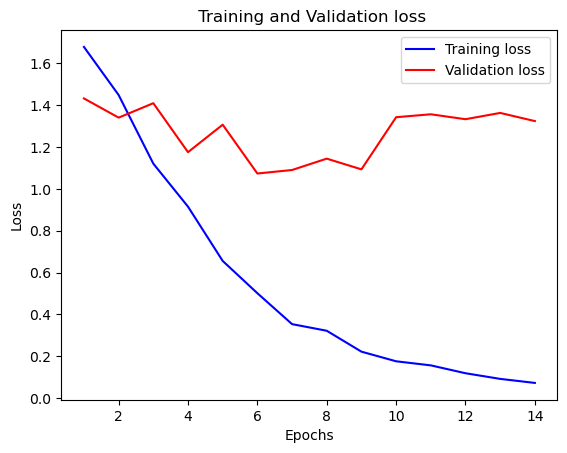

In [127]:
# Plot the training and validation loss
lossV1 = historyV1.history['loss']
val_lossV1 = historyV1.history['val_loss']
epochs = range (1, len(lossV1) + 1)
plt.plot (epochs, lossV1, 'b', label = 'Training loss')
plt.plot (epochs, val_lossV1, 'r', label = 'Validation loss')
plt.title(' Training and Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

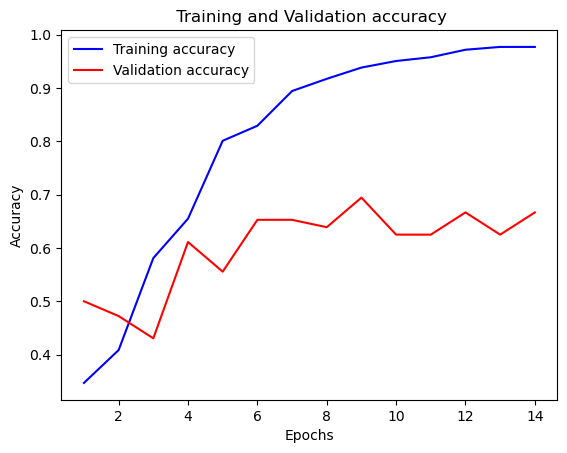

In [121]:
# Plot the training and validation accuracy
accV1 = historyV1.history['accuracy']
val_accV1 = historyV1.history['val_accuracy']
epochs = range (1, len(lossV1) + 1)
plt.plot (epochs, accV1, 'b', label = 'Training accuracy')
plt.plot (epochs, val_accV1, 'r', label = 'Validation accuracy')
plt.title(' Training and Validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

The plots seems to indicate overfitting due to training loss decreasing more gradually than the validation loss while training accuracy grows more rapidly and consistently than the validation accuracy during the training process. I hypothesize this is happening because normalising the image values in the preprocessing stage was sacrificed for the VGG16 model's performance. 

3/3 [==============================] - 0s 52ms/step


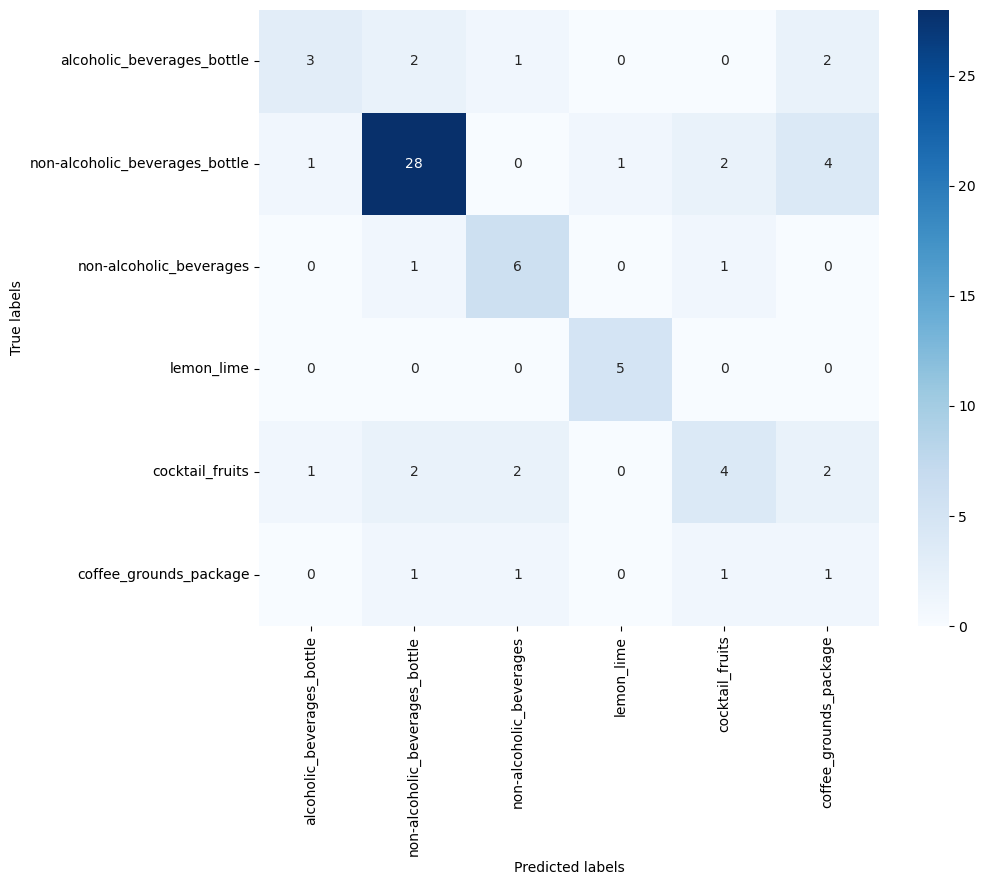

In [122]:
# Confusion matrix
y_pred_1 = model_1.predict(XV1_test)
y_pred_1 = np.argmax(y_pred_1, axis=1)
y_test_1 = np.argmax(yV1_test, axis=1)
confusion_matrix_1 = confusion_matrix(y_test_1, y_pred_1)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
class_names = ['alcoholic_beverages_bottle', 'non-alcoholic_beverages_bottle', 'non-alcoholic_beverages', 'lemon_lime', 'cocktail_fruits', 'coffee_grounds_package']
sns.heatmap(confusion_matrix_1, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

In [123]:
print(confusion_matrix_1)

[[ 3  2  1  0  0  2]
 [ 1 28  0  1  2  4]
 [ 0  1  6  0  1  0]
 [ 0  0  0  5  0  0]
 [ 1  2  2  0  4  2]
 [ 0  1  1  0  1  1]]


From the confusion matrix, we can see that class 4 (cocktail_fruits) has the most misclassifications (7), unlike the HLP, which indicates that cocktail fruits should be easily recognisible. On the contrary, the model does well in predicting class 1, as indicated by the high count of true positives (28).

In [124]:
# Evaluate the model on the test set
test_loss, test_accuracy = model_1.evaluate(XV1_test, yV1_test)
print("Test Accuracy model_1:", test_accuracy)

3/3 [==============================] - 0s 50ms/step - loss: 1.3207 - accuracy: 0.6528
Test Accuracy model_1: 0.6527777910232544


In [332]:
print("Validation accuracy:", historyV1.history['val_accuracy'][-1])

Validation accuracy: 0.6666666865348816


The model correctly classified about 65.28% of the instances in the test set. This is only a small improvement compared to the MLP's accuracy of 60%. It performs about the same on unseen data.

In [126]:
# Precision, recall and F1-score
print(classification_report(y_test_1, y_pred_1))

              precision    recall  f1-score   support

           0       0.60      0.38      0.46         8
           1       0.82      0.78      0.80        36
           2       0.60      0.75      0.67         8
           3       0.83      1.00      0.91         5
           4       0.50      0.36      0.42        11
           5       0.11      0.25      0.15         4

    accuracy                           0.65        72
   macro avg       0.58      0.59      0.57        72
weighted avg       0.69      0.65      0.66        72



The model performs relatively well for class 1 with high precision and recall, it struggles with other classes, such as class 0 and class 5, where precision, recall, and F1-scores are lower.

Some class imbalance in the dataset is indicated by variations in support across different classes in the classification report. However, this was purposely achieved when curating the dataset because some class classifications would be more useful in the application, such as for beverages.

_Model_1 shows reasonably good performance with an accuracy of 65.28%. However, its performance varies across different classes, with some classes being predicted more accurately than others._

### Iteration 2

**Augmented dataset**

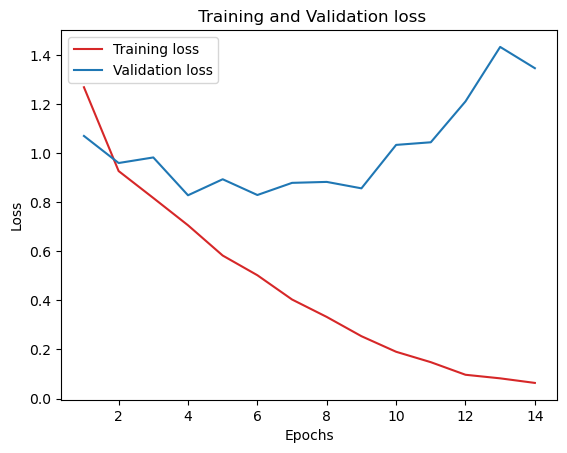

In [131]:
# Plot the training and validation loss
lossV2 = historyV2.history['loss']
val_lossV2 = historyV2.history['val_loss']
epochs = range (1, len(lossV2) + 1)
plt.plot (epochs, lossV2, 'tab:red', label = 'Training loss')
plt.plot (epochs, val_lossV2, 'tab:blue', label = 'Validation loss')
plt.title(' Training and Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

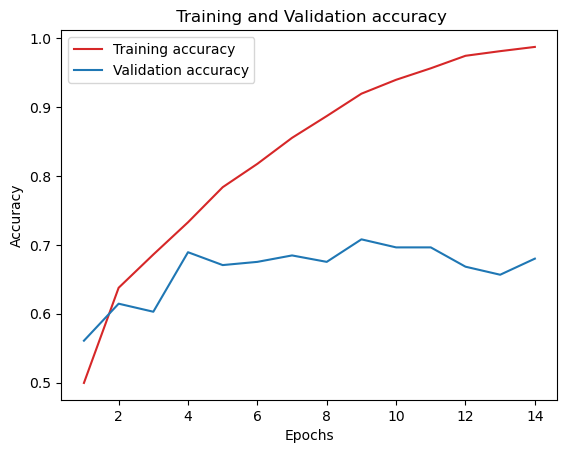

In [132]:
# Plot the training and validation accuracy
accV2 = historyV2.history['accuracy']
val_accV2 = historyV2.history['val_accuracy']
epochs = range (1, len(lossV2) + 1)
plt.plot (epochs, accV2, 'tab:red', label = 'Training accuracy')
plt.plot (epochs, val_accV2, 'tab:blue', label = 'Validation accuracy')
plt.title(' Training and Validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

We can observe from the graphs, that overfitting is even worse for model_2 even with the more variate dataset. Due to sacrificing normalisation, generalization has been affected for the simple CNN model

3/3 [==============================] - 0s 50ms/step


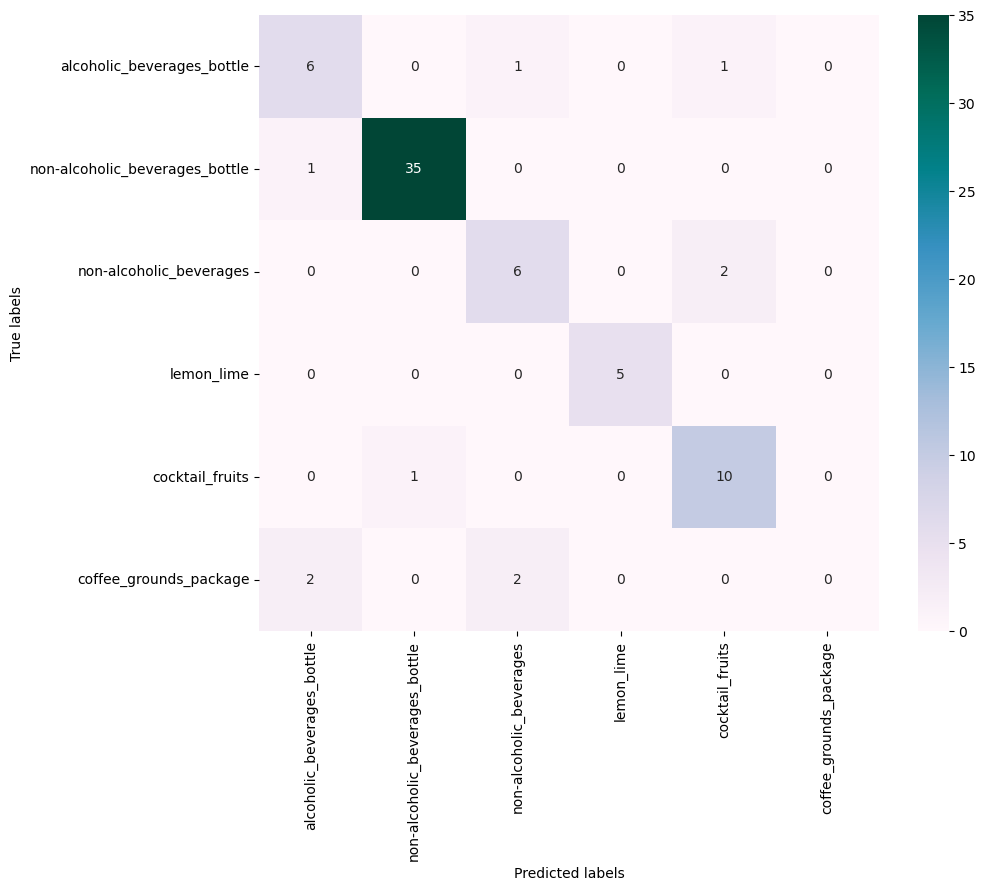

In [133]:
# Confusion matrix
y_pred_2 = model_2.predict(XV1_test)
y_pred_2 = np.argmax(y_pred_2, axis=1)
y_test_2 = np.argmax(yV1_test, axis=1)
confusion_matrix_2 = confusion_matrix(y_test_2, y_pred_2)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
class_names = ['alcoholic_beverages_bottle', 'non-alcoholic_beverages_bottle', 'non-alcoholic_beverages', 'lemon_lime', 'cocktail_fruits', 'coffee_grounds_package']
sns.heatmap(confusion_matrix_2, annot=True, fmt='d', cmap='PuBuGn', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

In [134]:
print(confusion_matrix_2)

[[ 6  0  1  0  1  0]
 [ 1 35  0  0  0  0]
 [ 0  0  6  0  2  0]
 [ 0  0  0  5  0  0]
 [ 0  1  0  0 10  0]
 [ 2  0  2  0  0  0]]


Class 1 (non-alcoholic_beverages_bottle) and class 3 (lemon_lime) were predicted with high accuracy, while class 5 (coffee_grounds_package) had several misclassifications.

In [135]:
# Evaluate the model on the test set
test_loss, test_accuracy = model_2.evaluate(XV2_test, yV2_test)
print("Test Accuracy model_2:", test_accuracy)

 4/14 [=======>......................] - ETA: 0s - loss: 1.4145 - accuracy: 0.6719

14/14 [==============================] - 1s 59ms/step - loss: 1.2984 - accuracy: 0.6939
Test Accuracy model_2: 0.6939252614974976


In [331]:
print("Validation accuracy:", historyV3.history['val_accuracy'][-1])

Validation accuracy: 0.875


The model correctly classified about 69.4% of the instances in the test set. Compared to the random guess accuracy of 36.37%, this indicates that the model has learned meaningful patterns in the data and can make accurate predictions beyond what would be achieved by random chance. However, the model performs quite well on unseen data.

In [136]:
# Precision, recall and F1-score
print(classification_report(y_test_2, y_pred_2))

              precision    recall  f1-score   support

           0       0.67      0.75      0.71         8
           1       0.97      0.97      0.97        36
           2       0.67      0.75      0.71         8
           3       1.00      1.00      1.00         5
           4       0.77      0.91      0.83        11
           5       0.00      0.00      0.00         4

    accuracy                           0.86        72
   macro avg       0.68      0.73      0.70        72
weighted avg       0.82      0.86      0.84        72



/Users/daria/anaconda3/envs/block_c/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/daria/anaconda3/envs/block_c/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/daria/anaconda3/envs/block_c/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capita

High precision values indicate that the model makes fewer false positive predictions for certain classes.
In this specific case, classes 1 (non-alcoholic_beverages_bottle) and 3 (lemon_lime) exhibit relatively high values, recall and F1-score values suggesting that the model has a low rate of misclassifying instances belonging to these classes and robust classification performance.


Higher recall values indicate that the model effectively captures most of the instances belonging to certain classes.
In this scenario, class 3 (lemon_lime) stands out with a perfect recall value of 1.0, indicating that the model correctly identifies all instances of this class, as the results of the human-level performance also indicates.

However, class 5 (coffee_grounds_package) shows lower metrics across precision, recall, and F1-score, indicating potential challenges in correctly identifying instances of this class.


Overall, model_2 demonstrates improved performance compared to model_1, particularly in terms of test accuracy and class-specific metrics.

### _VGG16-based model_

### Iteration 3

**Normal preprocessed dataset**

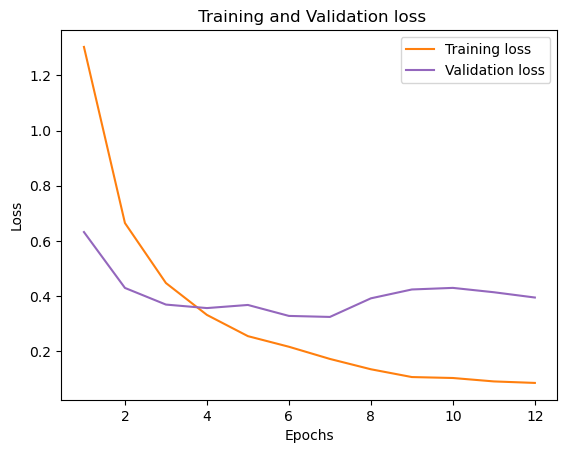

In [137]:
# Plot the training and validation loss
lossV3 = historyV3.history['loss']
val_lossV3 = historyV3.history['val_loss']
epochs = range (1, len(lossV3) + 1)
plt.plot (epochs, lossV3, 'tab:orange', label = 'Training loss')
plt.plot (epochs, val_lossV3, 'tab:purple', label = 'Validation loss')
plt.title(' Training and Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

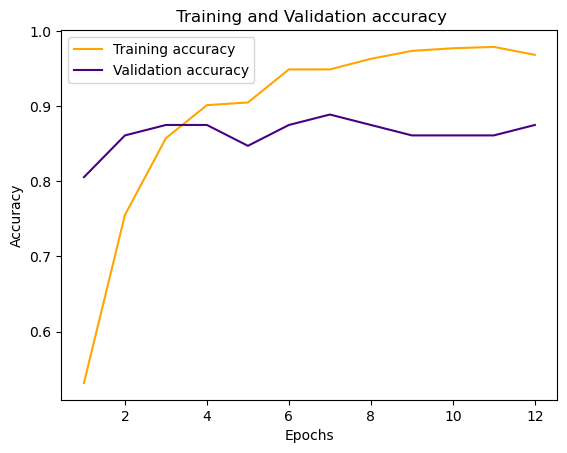

In [138]:
# Plot the training and validation accuracy
accV3 = historyV3.history['accuracy']
val_accV3 = historyV3.history['val_accuracy']
epochs = range (1, len(lossV3) + 1)
plt.plot (epochs, accV3, 'orange', label = 'Training accuracy')
plt.plot (epochs, val_accV3, 'indigo', label = 'Validation accuracy')
plt.title(' Training and Validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

The graphs could indicate overfitting.

3/3 [==============================] - 8s 2s/step


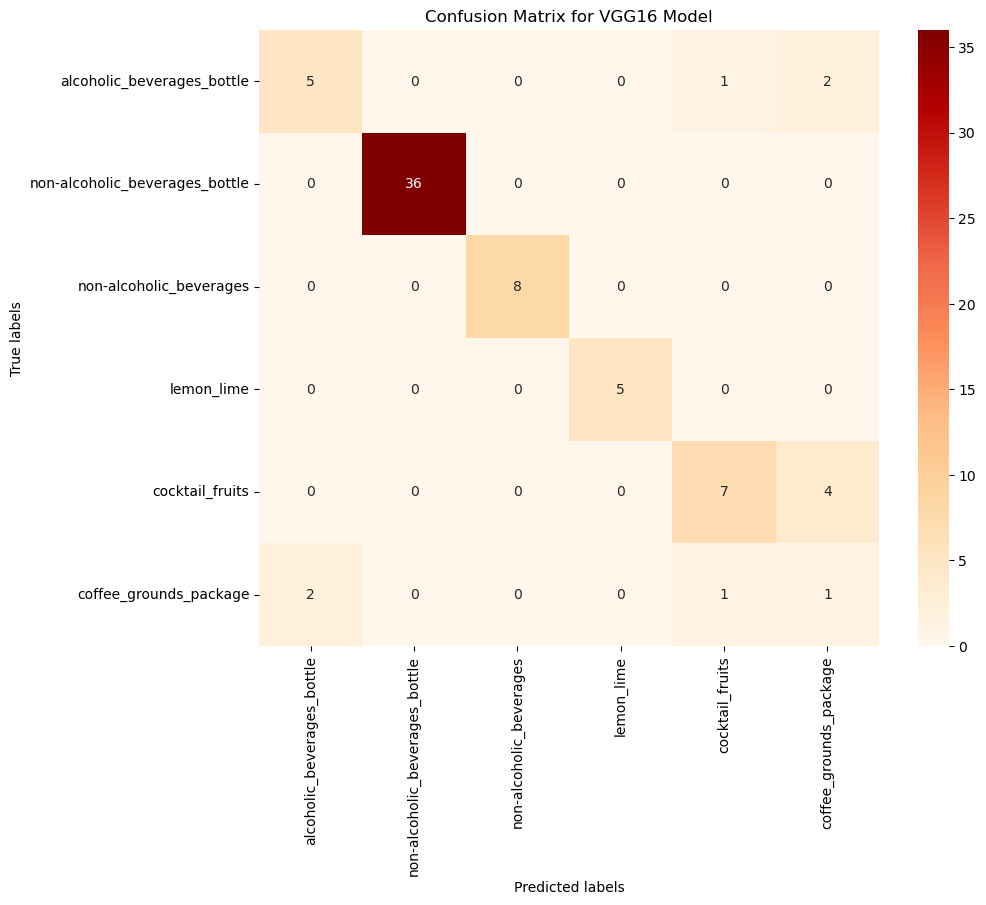

In [189]:
# Confusion matrix
y_pred_3 = model_3.predict(XV1_test)
y_pred_3 = np.argmax(y_pred_3, axis=1)
y_test_3 = np.argmax(yV1_test, axis=1)
confusion_matrix_3 = confusion_matrix(y_test_3, y_pred_3)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
class_names = ['alcoholic_beverages_bottle', 'non-alcoholic_beverages_bottle', 'non-alcoholic_beverages', 'lemon_lime', 'cocktail_fruits', 'coffee_grounds_package']
sns.heatmap(confusion_matrix_3, annot=True, fmt='d', cmap='OrRd', xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix for VGG16 Model')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

In [140]:
print(confusion_matrix_3)

[[ 5  0  0  0  1  2]
 [ 0 36  0  0  0  0]
 [ 0  0  8  0  0  0]
 [ 0  0  0  5  0  0]
 [ 0  0  0  0  7  4]
 [ 2  0  0  0  1  1]]


Class 4 (cocktail_fruits) has the highest number of misclassifications. 

The model correctly classified 7 out of 11 instances of class 4. However, it misclassified 4 instances as class 5.

On the other hand, the model performed very wellwith class 2 (non-alcholic beverages). All 8 instances of class 2 were correctly classified.

In [141]:
# Evaluate the model on the test set
test_loss, test_accuracy = model_3.evaluate(XV1_test, yV1_test)
print("Test Accuracy model_3:", test_accuracy)

3/3 [==============================] - 8s 2s/step - loss: 0.4965 - accuracy: 0.8611
Test Accuracy model_3: 0.8611111044883728


In [330]:
print("Validation accuracy:", historyV3.history['val_accuracy'][-1])

Validation accuracy: 0.875


The overall accuracy of 86.11% indicates that the model performed reasonably well in classifying the test instances. However, it also suggests that there is room for improvement, particularly in distinguishing between classes 0, 4, and 5 (the classes with misclassifications).
It performs about the same on unseen data, which is good.

In [188]:
# Precision, recall and F1-score
print(classification_report(y_test_3, y_pred_3))

              precision    recall  f1-score   support

           0       0.71      0.62      0.67         8
           1       1.00      1.00      1.00        36
           2       1.00      1.00      1.00         8
           3       1.00      1.00      1.00         5
           4       0.78      0.64      0.70        11
           5       0.14      0.25      0.18         4

    accuracy                           0.86        72
   macro avg       0.77      0.75      0.76        72
weighted avg       0.89      0.86      0.87        72



Class 1, 2 and 3 have perfect precision, recall and F1-score values, indicating accurate classification for said classes

For class 0: the precision of 71% indicates that when the model predicts class 0, it is correct 71% of the time. The recall of 62% suggests that the model correctly identifies 62% of actual class 0 instances.

For class 4: The precision of 78% indicates that when the model predicts class 4, it is correct 78% of the time. The recall of 64% suggests that the model correctly identifies 64% of actual class 4 instances.

For class 5: The low precision, recall, and F1-score for class 5 indicate challenges in correctly identifying and classifying instances of this class.

### Iteration 4

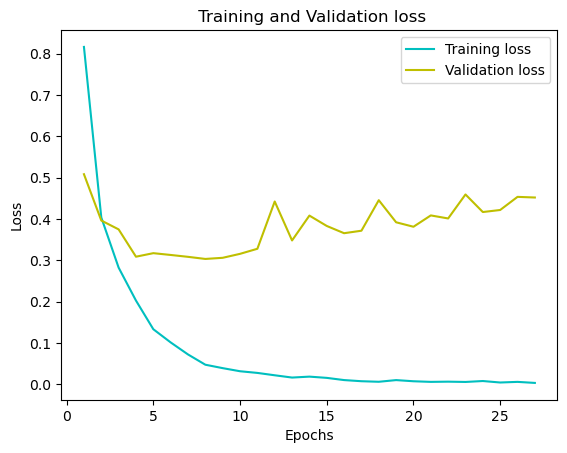

In [327]:
# Plot the training and validation loss
lossV4 = historyV4.history['loss']
val_lossV4 = historyV4.history['val_loss']
epochs = range (1, len(lossV4) + 1)
plt.plot (epochs, lossV4, 'c', label = 'Training loss')
plt.plot (epochs, val_lossV4, 'y', label = 'Validation loss')
plt.title(' Training and Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

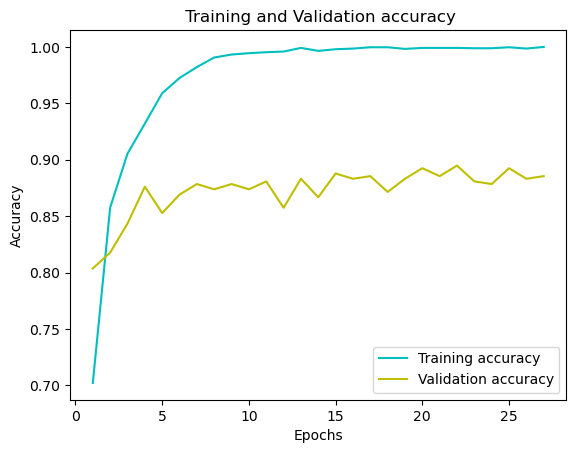

In [303]:
# Plot the training and validation accuracy
accV4 = historyV4.history['accuracy']
val_accV4 = historyV4.history['val_accuracy']
epochs = range (1, len(lossV4) + 1)
plt.plot (epochs, accV4, 'c', label = 'Training accuracy')
plt.plot (epochs, val_accV4, 'y', label = 'Validation accuracy')
plt.title(' Training and Validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

The plots also indicate the model could be overfitting as the improvement in accuracy is quite slow after epoch 5.

14/14 [==============================] - 49s 3s/step


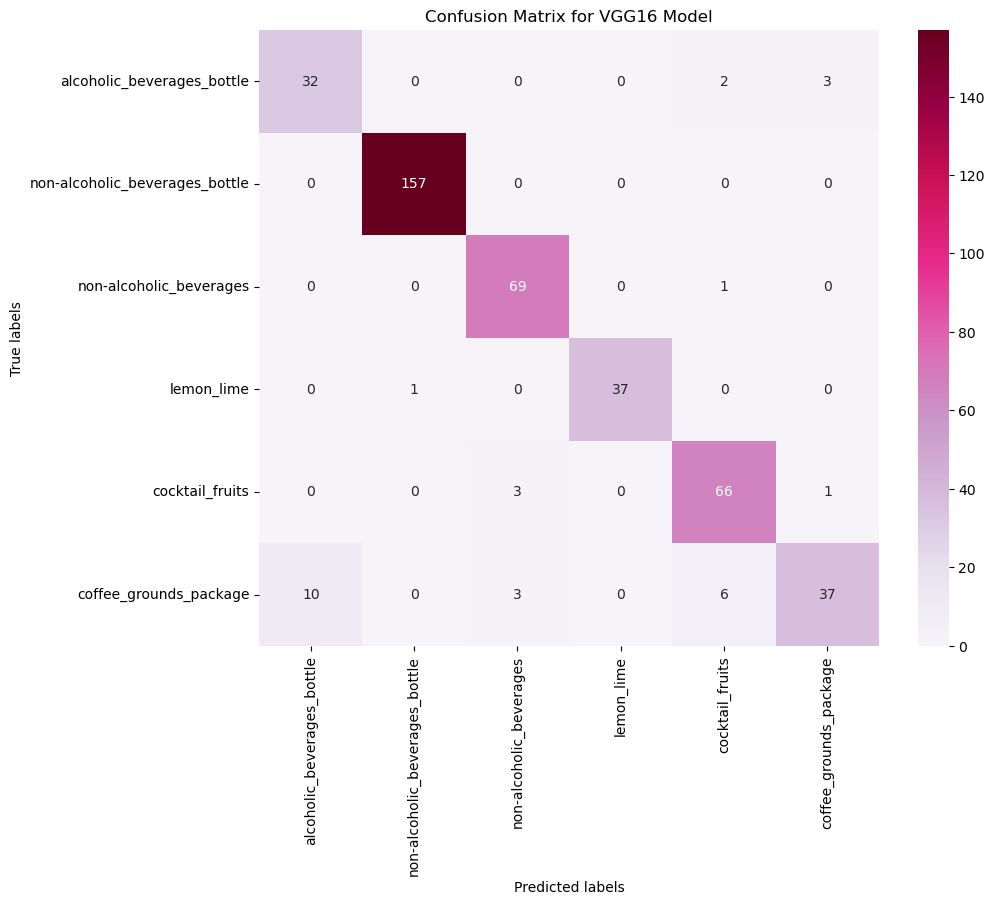

In [334]:
# Confusion matrix
y_pred_4 = model_4.predict(XV2_test)
y_pred_4 = np.argmax(y_pred_4, axis=1)
y_test_4 = np.argmax(yV2_test, axis=1)
confusion_matrix_4 = confusion_matrix(y_test_4, y_pred_4)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
class_names = ['alcoholic_beverages_bottle', 'non-alcoholic_beverages_bottle', 'non-alcoholic_beverages', 'lemon_lime', 'cocktail_fruits', 'coffee_grounds_package']
sns.heatmap(confusion_matrix_4, annot=True, fmt='d', cmap='PuRd', xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix for VGG16 Model')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

In [305]:
print(confusion_matrix_4)

[[ 32   0   0   0   2   3]
 [  0 157   0   0   0   0]
 [  0   0  69   0   1   0]
 [  0   1   0  37   0   0]
 [  0   0   3   0  66   1]
 [ 10   0   3   0   6  37]]


These results indicate that the model performs well forsome classes (particularily class 1 where it does not have any misclassifications), but struggles with others, particularly classes 0, 2, and 5, where there are more misclassifications.

In [306]:
# Evaluate the model on the test set
test_loss, test_accuracy = model_4.evaluate(XV2_test, yV2_test)
print("Test Accuracy model_4:", test_accuracy)

14/14 [==============================] - 65s 5s/step - loss: 0.2313 - accuracy: 0.9299
Test Accuracy model_4: 0.9299065470695496


In [329]:
print("Validation accuracy:", historyV4.history['val_accuracy'][-1])

Validation accuracy: 0.8855140209197998


The model achieved an accuracy of 92.99%. This indicates that overall, the model made correct predictions for the majority of the instances in the test set. The validation accuracy of 88.55% suggests that the model performs well on unseen data, which is essential for assessing its generalization ability.

In [42]:
# Precision, recall and F1-score
print(classification_report(y_test_4, y_pred_4))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        37
           1       0.50      0.01      0.01       157
           2       0.16      1.00      0.28        70
           3       0.00      0.00      0.00        38
           4       0.00      0.00      0.00        70
           5       0.00      0.00      0.00        56

    accuracy                           0.17       428
   macro avg       0.11      0.17      0.05       428
weighted avg       0.21      0.17      0.05       428



/Users/daria/anaconda3/envs/block_c/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/daria/anaconda3/envs/block_c/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/daria/anaconda3/envs/block_c/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capita

For class 2, the model is only correct about 16% of the time, which is very low. This suggests that the model tends to make a lot of false positive predictions for this class.



The recall values also vary across classes. For instance, class 2 (non-alcoholic beverages) has a recall of 100%, meaning that the model correctly identifies all instances of this class. However, other classes may have lower recall values, indicating that the model misses some instances of those classes.

The F1-scores are generally low, suggesting that the model's performance is not balanced between precision and recall across all classes.

Overall, these results suggest that while the model achieves high accuracy, its performance is not well-balanced across all classes. It may struggle with certain classes, leading to lower precision, recall, and F1-score for those classes. This could indicate areas for improvement in the model, such as addressing class imbalances, refining the training process, or exploring different model architectures.

### _Conclusions_

It seems both models have struggled with the cocktail_fruits class, even though there are many instances to train on in that class. On the other hand, that could be exactly the problem.

Contrary to HLP (98%), both models exhibit poor performance in classifying coffee_ground_package, which could be caused by a multitude of reasons, such as its inherent complexity. I believe, it is primarily due to class imbalance.

## Task 3.6 Error Analysis

In [369]:
# Folder paths where the images of each class are stored
folder_paths = [
    "dataset_copy/alcoholic_beverages_bottle",
    "dataset_copy/non-alcoholic_beverages_bottle",
    "dataset_copy/non-alcoholic_beverages",
    "dataset_copy/lemon_lime",
    "dataset_copy/cocktail_fruits",
    "dataset_copy/coffee_grounds_package",

]

# Class labels for the images (same order as folder_paths)
class_names = ['alcoholic_beverages_bottle', 'non-alcoholic_beverages_bottle', 'non-alcoholic_beverages', 'lemon_lime', 'cocktail_fruits', 'coffee_grounds_package']

# Target size to resize the images
target_size = (224, 224)

# Arrays to store the images (X) and class labels (y)
XV1 = []
yV1 = []

for i in range(len(folder_paths)):
    for filename in os.listdir(folder_paths[i]):
        file_extension = os.path.splitext(filename)[1]
        # Check if the file extension is an image extension 
        if file_extension == ".jpg" or file_extension == ".jpeg" or file_extension == ".png": 
            image_filename = os.path.join(folder_paths[i], filename)
            # Read the image file using scikit-image
            image = ski.io.imread(image_filename)
            # Normalize the image to values between 0 and 1
            image = image / 255.0                     # No normalisation as the VGG16 models accepts as input images with pixel values in the range [0, 255]
            # Resize the image to the target_size
            image_resized = ski.transform.resize(image, target_size)            
            # Insert the image into array X
            XV1.append(image_resized)
            # Insert the class label into array y
            yV1.append(class_names[i])

In [370]:
# Convert of arrays into numpy arrays
XV1 = np.array(XV1)
yV1 = np.array(yV1)

In [371]:
# Encode the class labels into integers
label_encoder = LabelEncoder()
label_encoder.classes_ = np.array(class_names)
y_integer_encoded_EA = label_encoder.fit_transform(yV1)
num_classes = len(np.unique(y_integer_encoded_EA))
y_onehot_encoded_EA = keras.utils.to_categorical(y_integer_encoded_EA, num_classes=num_classes)

# Split the dataset into training and testing sets
XEA_train, XEA_test, yEA_train, yEA_test = train_test_split(XV1,
                                                    y_onehot_encoded_EA,
                                                    test_size=1/10,
                                                    random_state=0)

# Split the dataset into training and validation sets
XEA_train, XEA_val, yEA_train, yEA_val = train_test_split(XEA_train,
                                                  yEA_train,
                                                  test_size = 1/9,
                                                  random_state = 0)

In [372]:
# Compare class names with encoded labels
print("Class Names:")
print(class_names)
print("\nEncoded Labels:")
print(label_encoder.classes_)

Class Names:
['alcoholic_beverages_bottle', 'non-alcoholic_beverages_bottle', 'non-alcoholic_beverages', 'lemon_lime', 'cocktail_fruits', 'coffee_grounds_package']

Encoded Labels:
['alcoholic_beverages_bottle' 'cocktail_fruits' 'coffee_grounds_package'
 'lemon_lime' 'non-alcoholic_beverages' 'non-alcoholic_beverages_bottle']


In [373]:
# Rearrange the class names as the encoded labels are in order to properly plot the misclassifications
class_names = [
    'alcoholic_beverages_bottle',
    'cocktail_fruits',
    'coffee_grounds_package',
    'lemon_lime',
    'non-alcoholic_beverages',
    'non-alcoholic_beverages_bottle'
]

### Iteration 1

In [374]:
# Get predictions on the test set
predictions = model_1.predict(XEA_test)

# The output of the model and the y labels are arrays of 
# 3 elements (e.g.: [0, 0, 1]). To compare them, we can 
# use the argmax function to get the index of the maximum 
# value in the array.
predicted_labels = np.argmax(predictions, axis=1)
actual_labels = np.argmax(yEA_test, axis=1)

# Find instances where predictions do not match labels
mismatches = np.where(predicted_labels != actual_labels)[0]

# Store the wrong predictions
wrong_predictions_1 = XEA_test[mismatches]

3/3 [==============================] - 0s 51ms/step


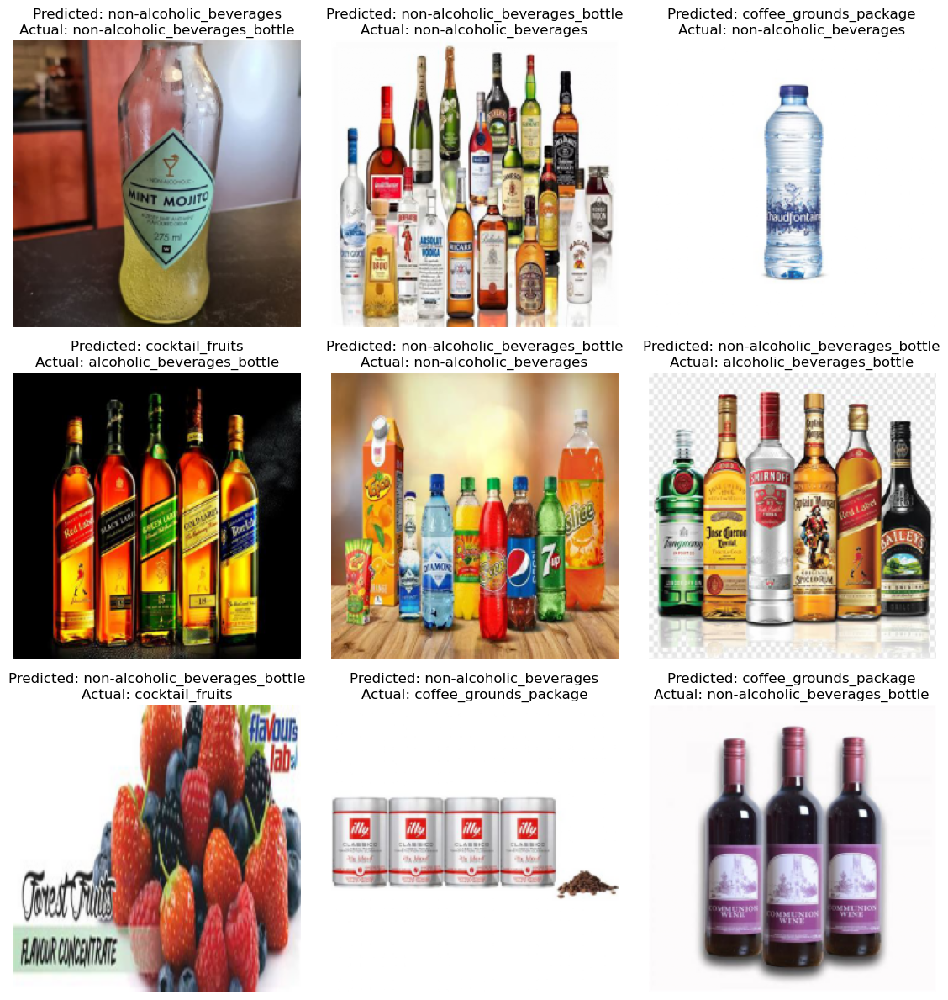

In [375]:
# Plot the wrong predictions
plt.figure(figsize=(12, 12))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(wrong_predictions_1[i])
    plt.title(f'Predicted: {class_names[predicted_labels[mismatches[i]]]}\nActual: {class_names[actual_labels[mismatches[i]]]}')
    plt.axis('off')
    plt.tight_layout()
plt.show()

- Scale variations errors: 1 (image 7)

In [391]:
print('Frequency of scale variation errors:', 1/9)

Frequency of scale variation errors: 0.1111111111111111


- Color variations errors: 1 (image 4)

In [392]:
print('Frequency of color variation errors:', 1/9)

Frequency of color variation errors: 0.1111111111111111


- Image quality and noise errors : 3 (images 3, 8, 9)

In [393]:
print('Frequency of image quality and noise errors:', 3/9)

Frequency of image quality and noise errors: 0.3333333333333333


- Inter-class similarity errors : 4 (images 1, 2, 5, 6)

In [394]:
print('Frequency of inter-class similarity errors:', 4/9)

Frequency of inter-class similarity errors: 0.4444444444444444


The most prominent erorr class is inter-class similarity.

The class that this model has the most trouble classifying is non-alcoholic_beverages_bottle. The misclassifications can be categorized as following:
- Scale Variations, such as in the case of image 7, as the subject is disproportionately scaled compared to the training data.
- Color Variations, such as in the case of image 4, as color is the main predicament of the class cocktail_fruits and the image has shades of orange and red.
- Image quality and noise, such as in the case of image 3, as the images are of a low resolution. I believe this was a common factor throughout all of the missclassifcations.
- Inter-class similarity, as the classes non_alcoholic_beverages and alcoholic_beverages_bottle share similar features, such as bottle shape and colours.

To improve model performance, we could employ advanced preprocessing techniques beyond the basic ones used previously: enhance image quality by denoising or using higher-resolution images, balance the dataset to mitigate inter-class similarity, ensuring equal representation of each class, experiment with deeper architectures, apply post-processing techniques like thresholding to refine predictions. By incorporating these advanced preprocessing methods, iteratively evaluate and refine the model's performance, especially for challenging classes like "non-alcoholic_beverages_bottle".

### Iteration 2

In [376]:
# Get predictions on the test set
predictions = model_2.predict(XV2_test)

# The output of the model and the y labels are arrays of 
# 3 elements (e.g.: [0, 0, 1]). To compare them, we can 
# use the argmax function to get the index of the maximum 
# value in the array.
predicted_labels = np.argmax(predictions, axis=1)
actual_labels = np.argmax(yV2_test, axis=1)

# Find instances where predictions do not match labels
mismatches = np.where(predicted_labels != actual_labels)[0]

# Store the wrong predictions
wrong_predictions_2 = XV2_test[mismatches]

14/14 [==============================] - 1s 75ms/step


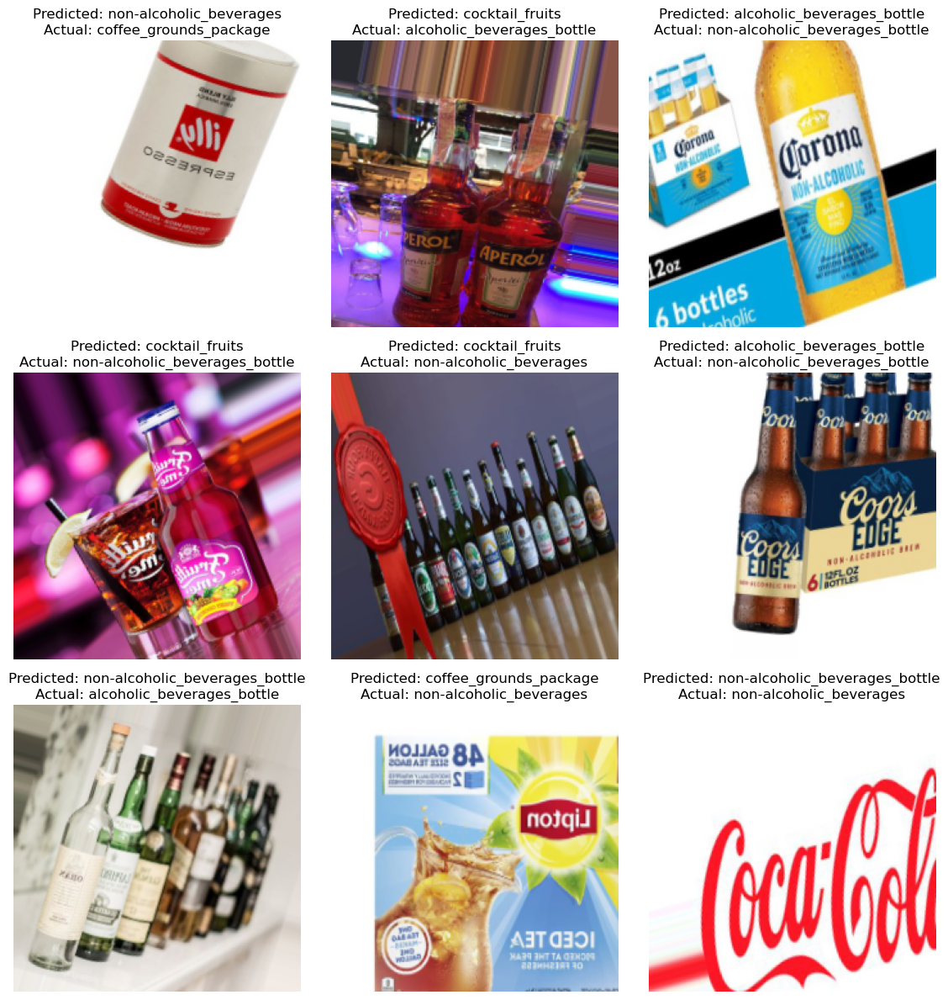

In [377]:
# Plot the wrong predictions
plt.figure(figsize=(12, 12))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(wrong_predictions_2[i])
    plt.title(f'Predicted: {class_names[predicted_labels[mismatches[i]]]}\nActual: {class_names[actual_labels[mismatches[i]]]}')
    plt.axis('off')
    plt.tight_layout()
plt.show()

- Image quality and noise errors : 1 (image 1)

- Color variations errors: 2 (images 2, 5 )

- Inter-class similarity errors: 4 (images 3, 6, 7, 8)

- Scale Variation errors: 1 (image 9)

- Background confusion errors: 1 (image 4)

In [399]:
print('Frequency of image quality and noise errors:', 1/9)
print('Frequency of color variation errors:', 2/9)
print('Frequency of inter-class similarity errors:', 4/9)
print('Frequency of scale variation errors:', 1/9)
print('Frequency of background confusion errors:', 1/9)

Frequency of image quality and noise errors: 0.1111111111111111
Frequency of color variation errors: 0.2222222222222222
Frequency of inter-class similarity errors: 0.4444444444444444
Frequency of scale variation errors: 0.1111111111111111
Frequency of background confusion errors: 0.1111111111111111


The error with the highest frequency is yet again inter-class similarity.

The class that this model has the most trouble classifying is non-alcoholic_beverages_bottle. The misclassifications can be categorized as following:
- Scale Variations, as the subject is disproportionately scaled due to augmented techniques.
- Color Variations, as color is the main predicament of the class cocktail_fruits and the images have shades of orange and red. Specifically, the model set the ribbon in image 5 as the main determiner of the class.
- Image quality and noise, as the image are of a low resolution.
- Inter-class similarity, as the classes non_alcoholic_beverages and alcoholic_beverages_bottle share similar features, such as bottle shape and colo. As for image 8, I believ the error was mainly caused by similar colors in the packaging of the objects of the two classes.
- Background confusion, as the shades in the background of image 4 are reds and organges, the main predicament of the class cocktail_fruits.

To enhance model performance with the existing augmented dataset, several strategies can be pursued. Firstly, adjusting the augmentation process to introduce variations specifically tailored to address scale and color variations can improve classification accuracy. Secondly, applying advanced denoising techniques to the augmented images can enhance image quality and reduce noise-related errors. Thirdly, ensuring a diverse representation of distinguishing features among classes, especially those with high similarity, aids in reducing inter-class confusion. 

### Iteration 3

In [388]:
# Get predictions on the test set
predictions = model_3.predict(XV1_test)

# The output of the model and the y labels are arrays of 
# 3 elements (e.g.: [0, 0, 1]). To compare them, we can 
# use the argmax function to get the index of the maximum 
# value in the array.
predicted_labels = np.argmax(predictions, axis=1)
actual_labels = np.argmax(yV1_test, axis=1)

# Find instances where predictions do not match labels
mismatches = np.where(predicted_labels != actual_labels)[0]

# Store the wrong predictions
wrong_predictions_3 = XV1_test[mismatches]

3/3 [==============================] - 8s 2s/step


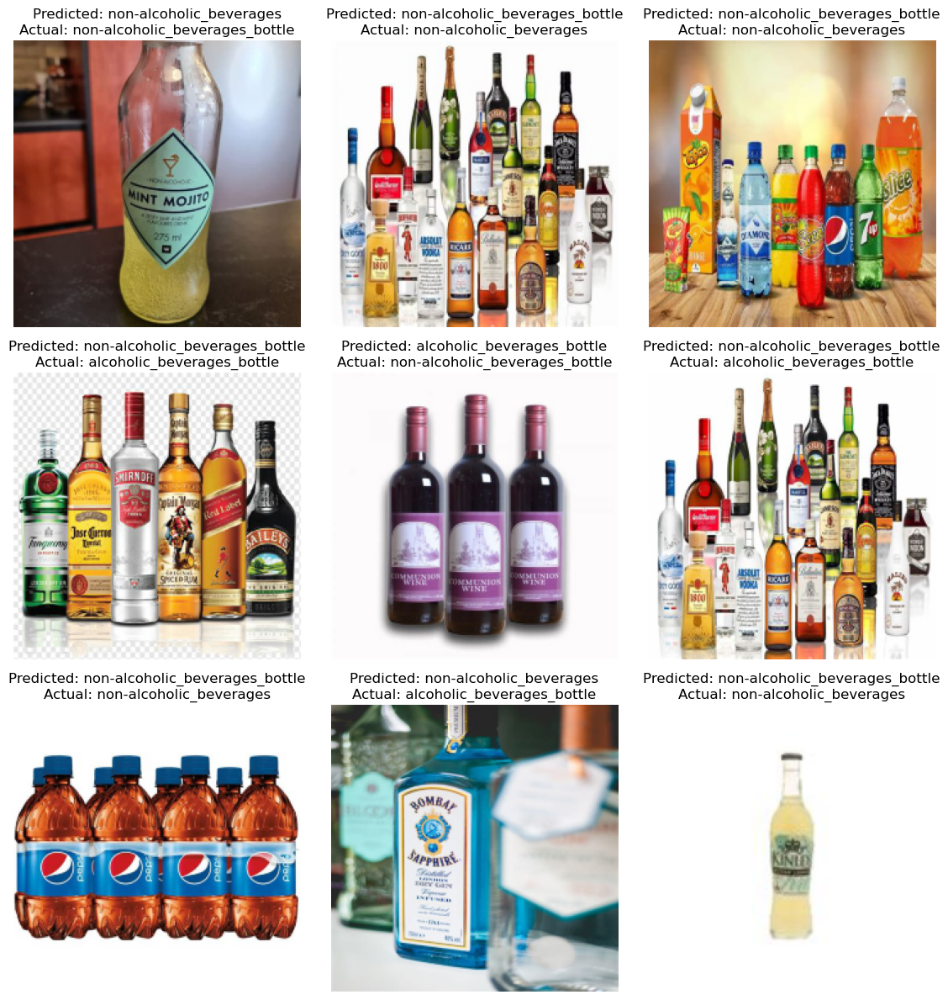

In [389]:
# Plot the wrong predictions
plt.figure(figsize=(12, 12))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(wrong_predictions_3[i])
    plt.title(f'Predicted: {class_names[predicted_labels[mismatches[i]]]}\nActual: {class_names[actual_labels[mismatches[i]]]}')
    plt.axis('off')
    plt.tight_layout()
plt.show()

- Inter-class similarity errors: 8 (images 1, 3, 4, 6, 7, 8, 9)
  
As image 2 was plotted wrongly with its labels for unknown reasons, I will not consider it for my analysis.

In [400]:
print('Frequency of inter-class similarity errors:', 8/8)

Frequency of inter-class similarity errors: 1.0


For the VGG16-based model, most of the errors during training using the basic preprocessed dataset were made due to inter-class similarity issues. The most misclassified classes were non-alcoholic beverages bottle (4/8) and non-alcoholic beverages (3/8), and they were mostly missclasified as eachother.

I believe the best strategies to employ to improve the error frequencies of this model are the same as the for the CNN model: enhance image quality by denoising or using higher-resolution images, balance the dataset to mitigate inter-class similarity, ensuring equal representation of each class, experiment with deeper architectures, apply post-processing techniques like thresholding to refine predictions.

### Iteration 4

In [401]:
# Get predictions on the test set
predictions = model_4.predict(XV2_test)

# The output of the model and the y labels are arrays of 
# 3 elements (e.g.: [0, 0, 1]). To compare them, we can 
# use the argmax function to get the index of the maximum 
# value in the array.
predicted_labels = np.argmax(predictions, axis=1)
actual_labels = np.argmax(yV2_test, axis=1)

# Find instances where predictions do not match labels
mismatches = np.where(predicted_labels != actual_labels)[0]

# Store the wrong predictions
wrong_predictions_4 = XV2_test[mismatches]

14/14 [==============================] - 47s 3s/step


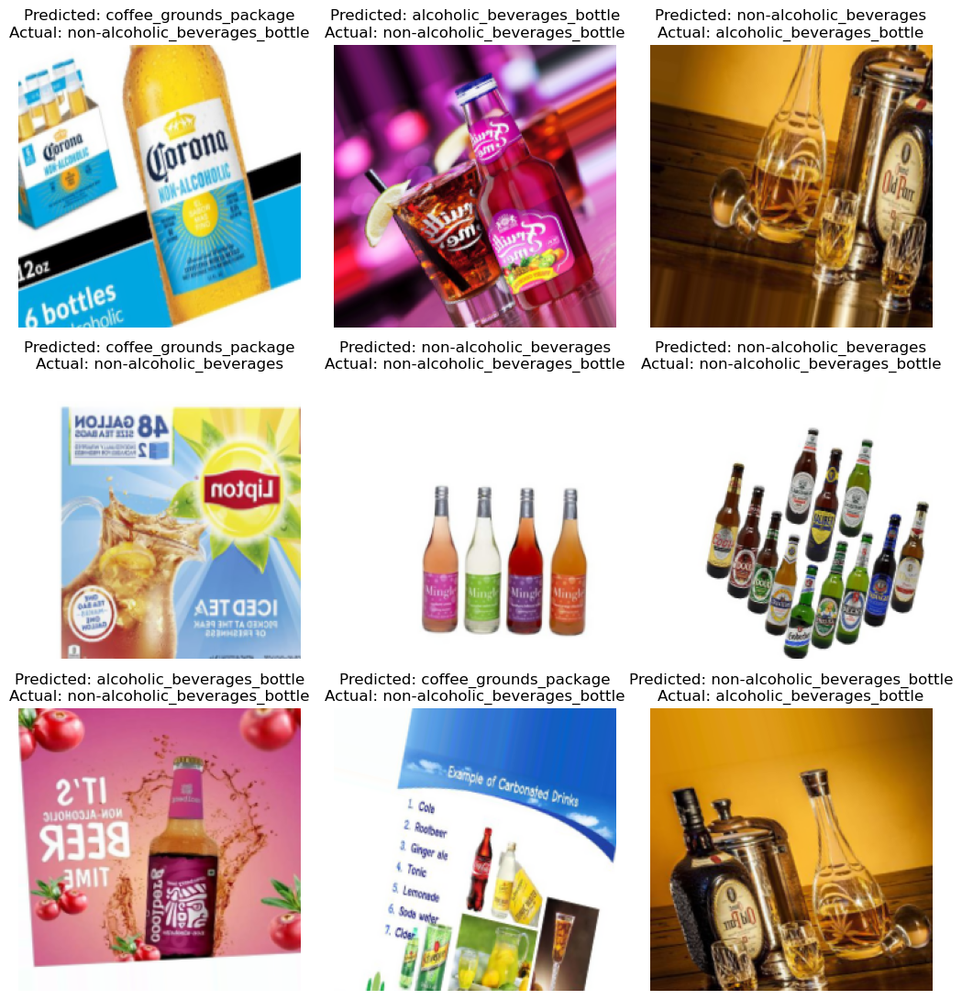

In [402]:
# Plot the wrong predictions
plt.figure(figsize=(11, 11))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(wrong_predictions_4[i])
    plt.title(f'Predicted: {class_names[predicted_labels[mismatches[i]]]}\nActual: {class_names[actual_labels[mismatches[i]]]}')
    plt.axis('off')
    plt.tight_layout()
plt.show()

- Pose and Orientation Variability errors: 2 (images 1, 8)
- Inter-class Similarity errors: 7 (images 2, 3, 4, 5, 6, 7, 9)

In [403]:
print('Frequency of pose and orientation variability errors:', 2/9)
print('Frequency of inter-class similarity errors:', 7/9)

Frequency of pose and orientation variability errors: 0.2222222222222222
Frequency of inter-class similarity errors: 0.7777777777777778


Here we encounter a new type of error category: pose and orientation variability. I believ this occurs mainly due to the data augmentation process' repercussions, as it alters images in such a way that includes a variety of poses, the model struggling to recognize subjects in atypical positions.

To mitigate pose and orientation variability errors in the VGG16-based model, several strategies can be implemented. Firstly, we could refine the data augmentation process to generate variations that maintain object orientation consistency, ensuring a balanced representation of different poses. Secondly, incorporating additional training data specifically focused on diverse poses and orientations to improve model robustness. Thirdly, we could even consider using transfer learning from models trained on pose-invariant datasets or architectures designed to handle pose variations effectively. 

## Task 3.7 MLP From Scratch

Some modifications had to be made due to high computational time such as reducing image size and only using 10% of my dataset.

In [5]:
# Folder paths where the images of each class are stored
folder_paths = [
    "dataset_copy/alcoholic_beverages_bottle",
    "dataset_copy/non-alcoholic_beverages_bottle",
    "dataset_copy/non-alcoholic_beverages",
    "dataset_copy/lemon_lime",
    "dataset_copy/cocktail_fruits",
    "dataset_copy/coffee_grounds_package",
]

# Class labels for the images (same order as folder_paths)
class_names = [
    "alcoholic_beverages_bottle",
    "non-alcoholic_beverages_bottle",
    "non-alcoholic_beverages",
    "lemon_lime",
    "cocktail_fruits",
    "coffee_grounds_package"
]

# Target size to resize the images
target_size = (16, 16)                  # I had to use small images due to high computational time

# Arrays to store the images (X) and class labels (y)
X_MLP = []
y_MLP = []

# Initialize label encoder
label_encoder = LabelEncoder()

for i in range(len(folder_paths)):
    img_count = 0
    for filename in os.listdir(folder_paths[i]):
        file_extension = os.path.splitext(filename)[1]
        # Check if the file extension is an image extension
        if file_extension.lower() in [".jpg", ".jpeg", ".png"]:
            image_filename = os.path.join(folder_paths[i], filename)
            # Read the image file using scikit-image
            image = ski.io.imread(image_filename)
            # Resize the image to the target_size
            image_resized = ski.transform.resize(image, target_size)
            # Ensure the resized image has the expected shape
            if (image_resized.shape == (16, 16, 3) and img_count <= 60) :  # Ensure RGB images    # Use 10 images per class due to high computational time
                # Insert the image into array X
                X_MLP.append(image_resized)
                # Insert the class label into array y
                y_MLP.append(class_names[i])
                img_count += 1

# Convert arrays into numpy arrays
X_MLP = np.array(X_MLP)
y_MLP = np.array(y_MLP)

# Encode the class labels into integers
y_integer_encoded_MLP = label_encoder.fit_transform(y_MLP)

num_classes = len(np.unique(y_integer_encoded_MLP))

# Perform one-hot encoding
y_onehot_encoded_MLP = keras.utils.to_categorical(y_integer_encoded_MLP, num_classes=num_classes)

In [7]:
# Split the dataset into training and testing sets
X_MLP_train, X_MLP_test, y_MLP_train, y_MLP_test = train_test_split(X_MLP,
                                                    y_onehot_encoded_MLP,
                                                    test_size=1/10,
                                                    random_state=0)

In [8]:
# Split the dataset into training and validation sets
X_MLP_train, X_MLP_val, y_MLP_train, y_MLP_val = train_test_split(X_MLP_train,
                                                  y_MLP_train,
                                                  test_size=1/9,
                                                  random_state=0)

In [9]:
# Reshape the input data to a 2D array of 16x16 pixels x 3 channels
X_MLP_train = X_MLP_train.reshape(-1, 16 * 16 * 3)
X_MLP_test = X_MLP_test.reshape(-1, 16 * 16 * 3)
X_MLP_val = X_MLP_val.reshape(-1, 16 * 16 * 3)

In [10]:
def initializer(nn_architecture):
    '''
    Given
    - the number of layers 
    - the number of units in each layer
    initializes network parameters (weights and biases)
    
    Arguments
        nn_architecture: a list of integers
                         length of the list is the number of layers
                         each item in the list specifies 
                         the number of units in that layer
    Returns
        weights: list of numpy arrays, w0, w1, ...
        biases: list of numpy arrays, b0, b1, ...
        
    '''
    weights = []
    biases = []
    
    for i in range(1, len(nn_architecture)): 
        w = np.random.randn(nn_architecture[i-1], nn_architecture[i]) # w0, w1, ...
        b = np.random.randn(1, nn_architecture[i]) # b0, b1, ...
        weights.append(w) 
        biases.append(b)
    return weights, biases

In [11]:
def sigmoid(x):
    '''
    Calculates the sigmoid of an input
    Arguments
        x: np.array() of real numbers
    Returns
        np.array() of real numbers between 0 and 1
    
    '''
    sig = 1/(1 + np.exp(-x))
    
    return sig

In [12]:
def predict(X, weights, biases):
    '''
    Given an input and NN parameters,
    this function calculates the output
    
    Arguments
        X: np.array() of shape 
        (#datapoints, #features)
        weights: list of np arrays
        biases: list of np arrays
    Returns
        y_pred: np.array() of shape
        (#datapoints, #classes)
    
    '''
    
    # Layer 1 output
    for i in range(len(weights)):
        X = sigmoid(np.dot(X, weights[i]) + biases[i])
    y_pred = X
    return y_pred

In [13]:
def accuracy(y_pred_binary, y):
    '''
    Given
    -binary predictions
    -labels
    calculates accuracy

    '''

    return sum(y_pred_binary == y)/len(y)

In [14]:
def loss_function(X, y, weights, biases):
    losses = []
    for i in range(len(X)):
        prediction = predict(X[i], weights, biases)
        # Cross-entropy loss calculation
        loss = -np.sum(y[i] * np.log(prediction))
        losses.append(loss)

    return np.mean(losses)

In [15]:
def weight_update(weights, layer_id, i, j, new_param):
    '''
    Given a single weight defined by (layer_id, i, j)
    updates it with a new parameter (new_param)

    Arguments
        weights: list of np.arrays()
        layer_id: integer
        i: integer
        j: integer
        new_param: float
    Return
        new_w: list of np.arrays()
               where only a single value is changed
               compared to weights

    '''
    # It is important to create a copy of the weights and update the copy
    new_w = deepcopy(weights)

    layer_w = weights[layer_id]
    new_layer_w = layer_w.copy()
    new_layer_w[i, j] = new_param
    new_w[layer_id] = new_layer_w

    return new_w

In [16]:
def bias_update(biases, layer_id, j, new_param):
    '''
    Given a single bias defined by (layer_id, j)
    updates it with a new parameter (new_param)

    Arguments
        biases: list of np.arrays()
        layer_id: integer
        j: integer
        new_param: float
    Return
        new_b: list of np.arrays()
               where only a single value is changed

    '''

    # It is important to create a copy and update the copy
    new_b = deepcopy(biases)

    layer_b = biases[layer_id]
    new_layer_b = layer_b.copy()
    new_layer_b[0, j] = new_param
    new_b[layer_id] = new_layer_b

    return new_b

In [17]:
def gradient_estimator(X, y, weights, biases):
    '''
    This function estimates

    ∂(loss_function)/∂(w_ij) and
    ∂(loss_function)/∂(b_ij)

    for every weight and bias.

    ∂(loss_function)/∂(w_ij) can be estimated by
    [(loss for w_ij+epsilon) - (loss with w_ij)]/epsilon

    likewise

    ∂(loss_function)/∂(b_ij) can be estimated by
    [(loss for b_ij+epsilon) - (loss with b_ij)]/epsilon

    For each parameter in weights and biases,
    the function will estimate
    ∂(loss_function)/∂(w_ij) and ∂(loss_function)/∂(b_ij)
    and return a list of np.arrays()
    called w_pds and b_pds, respectively.

    Arguments
        X: input data
        y: labels
        weights: list of np arrays, weights of the MLP
        biases: list of np arrays, biases of the MLP
    Returns
        w_pds: list of np arrays, same dimensions with weights
        b_pds: list of np arrays, same dimensions with biases
    '''
    eps = 1e-4
    loss_val = loss_function(X, y, weights, biases)

    # partial derivatives for weights
    w_pds = []
    for layer_id, layer_w in enumerate(weights):
        pd_array = np.zeros(layer_w.shape)

        # Calculate the partial derivative (pd) for each weight
        # and save those values into pd_array

        for i in range(layer_w.shape[0]):
            for j in range(layer_w.shape[1]):

                wij = layer_w[i, j]

                wij_plus = wij + eps
                w_plus = weight_update(weights, layer_id, i, j, wij_plus)
                loss_plus = loss_function(X, y, w_plus, biases)

                pd = (loss_plus - loss_val)/eps
                pd_array[i, j] = pd

        w_pds.append(pd_array)

    # partial derivatives for biases
    b_pds = []
    for layer_id, layer_b in enumerate(biases):
        pd_array = np.zeros(layer_b.shape)

        # Calculate the partial derivative (pd) for each bias
        # and save those values into pd_array

        for j in range(layer_b.shape[1]):
            i = 0
            bij = layer_b[i, j]

            bij_plus = bij + eps
            b_plus = bias_update(biases, layer_id, j, bij_plus)
            loss_plus = loss_function(X, y, weights, b_plus)

            pd = (loss_plus - loss_val)/eps
            pd_array[i, j] = pd

        b_pds.append(pd_array)

    return w_pds, b_pds

In [18]:
def one_step_gradient_descent(X, y, weights, biases, lr):
    '''
    This function executes one step of gradient decent and updates weights and biases.

    First estimate the gradient using the gradient_estimator function implemented
    in the previous task.

    Then, update the params by:
    w = w - lr * w_pds
    b = b - lr * b_pds

    Arguments:
        X: input data
        y: labels
        weights: NN weights
        biases: NN biases
        lr: learning rate, a float
    Returns:
        new_w: updated weights, same size as weights
        new_b: updated biases, same size as biases

    '''
    w_pds, b_pds = gradient_estimator(X, y, weights, biases)

    new_w = []
    # For each weight array in weights list
    # use gradient descent update rule
    # append the array to new_w list

    for layer_id, layer_w in enumerate(weights):
        layer_new_w = layer_w - lr*w_pds[layer_id]
        new_w.append(layer_new_w)

    new_b = []
    # For each bias array in biases list
    # use gradient descent update rule
    # append the array to new_b list

    for layer_id, layer_b in enumerate(biases):
        layer_new_b = layer_b - lr*b_pds[layer_id]
        new_b.append(layer_new_b)

    return new_w, new_b

In [19]:
def gradient_descent(X, y, weights, biases, epoch, lr):
    '''
    Repeats one_step_gd()
    for given number of epochs
    Saves and plots the error at each epoch
    Arguments
        X: input data
        y: labels
        weights: NN weights
        biases: NN biases
        epoch: integer
        lr: float
    Return
        weights: learned weights
        biases: learned biases
    '''

    errors = []

    for i in range(epoch):
        print('epoch', i)
        weights, biases = one_step_gradient_descent(X, y, weights, biases, lr)
        error = loss_function(X, y, weights, biases)

        errors.append(error)

    plt.figure(dpi=200)
    plt.plot(errors)
    plt.xlabel('# epochs')
    plt.ylabel('loss')

    return weights, biases

In [20]:
print(X_MLP_train.shape, X_MLP_test.shape, y_MLP_train.shape, y_MLP_test.shape)

(292, 768) (37, 768) (292, 6) (37, 6)


I experimented with different architectures of the neural networks.

_Architecture of 15 nodes with a learnign rate of 0.01_

epoch 0
epoch 1
epoch 2
epoch 3
epoch 4


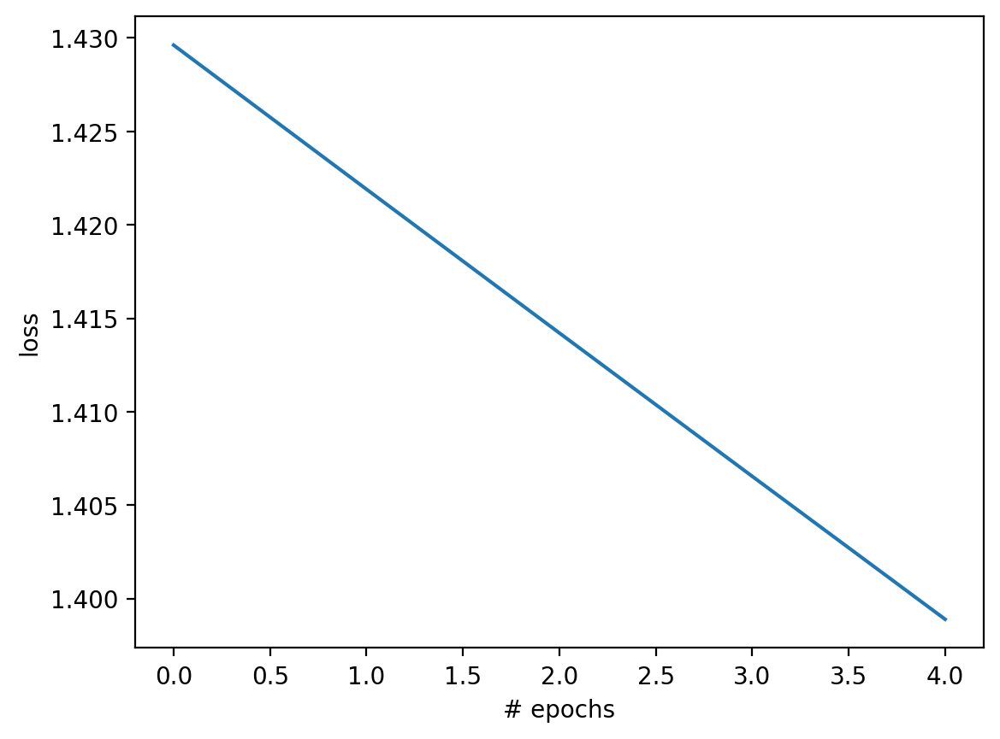

In [44]:
# Define MLP architecture
nn_architecture = [X_MLP_train.shape[1], 15, 6]

# Initialize weights and biases
weights, biases = initializer(nn_architecture)

# Train the MLP using gradient descent
trained_weights, trained_biases = gradient_descent(X_MLP_train, y_MLP_train, weights, biases, epoch=5, lr=0.01)

In [50]:
# Evaluate the MLP on the test set
y_pred_test = predict(X_MLP_test, trained_weights, trained_biases)
test_preds = (y_pred_test > 0.5)*1
test_accuracy = accuracy(test_preds, y_MLP_test)

print("Test Accuracy:", test_accuracy)

Test Accuracy 1: [0.75675676 0.78378378 0.08108108 0.13513514 0.40540541 0.78378378]


The first model did particularily well in predicting class 0, 1, and 5.

However, classes 3 and 4 were very poorly predicted with an accuracy of 8.1% and 1.3% , respectively.

In [24]:
print("Overall Test Accuracy model 1:", (0.75675676 + 0.78378378 + 0.08108108 + 0.13513514 + 0.40540541 + 0.78378378)/ 6)

Overall Test Accuracy model 1: 0.49099099166666677


_Architecture of 20 nodes with a learnign rate of 0.001_

epoch 0
epoch 1
epoch 2
epoch 3
epoch 4


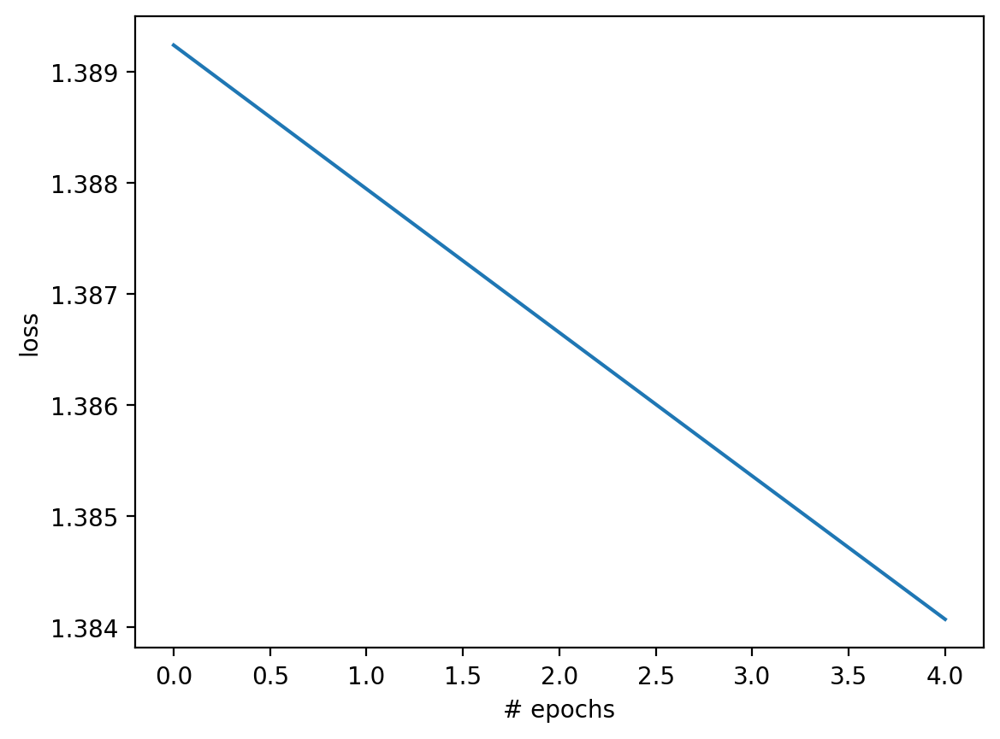

In [47]:
# Define MLP architecture
nn_architecture = [X_MLP_train.shape[1], 20, 6]

# Initialize weights and biases
weights, biases = initializer(nn_architecture)

# Train the MLP using gradient descent
trained_weights, trained_biases = gradient_descent(X_MLP_train, y_MLP_train, weights, biases, epoch=5, lr=0.001)

In [48]:
# Evaluate the MLP on the test set
y_pred_test = predict(X_MLP_test, trained_weights, trained_biases)
test_preds = (y_pred_test > 0.5)*1
test_accuracy = accuracy(test_preds, y_MLP_test)

print("Test Accuracy:", test_accuracy)

Test Accuracy: [0.75675676 0.67567568 0.89189189 0.16216216 0.89189189 0.24324324]


The second variation has a noticeable improvement in all class. The most remarkable of them are predictions for class 3, which improved from 8.1% to 89%.

For class 4, however, the improvement is not significant (from 13% to 16%).

On the other hand, prediction accuracy for class 5 dropped from 78% all the way to 24%.

In [23]:
print("Overall Test Accuracy model 2:", (0.75675676 + 0.67567568 + 0.67567568 + 0.16216216 + 0.89189189 + 0.24324324)/ 6)

Overall Test Accuracy model 2: 0.5675675683333333


### _Conclusion_

The second model shows a better overall accuracy. More nodes allow it to capture more complex relationships in the data. Additionally, the lower learning rate contributes to more stable convergence during training, ensuring that the model reaches a better solution by making smaller and more precise adjustments to the weights and biases.

# Section 4 - Human-Centered AI (Weeks 7 and 8)

## Task 4.1: Think-Aloud Study

Initial wireframe: 

<img src = 'Wireframe A.png' width='500'>

[Think-Aloud Study Results](https://github.com/BredaUniversityADSAI/2023-24c-fai1-adsai-dariavladutu236578/blob/main/Week%207%20-%20Human%20-%20centered%20AI/User%20Transcriptions/User%20Interviews.pdf)

## Task 4.2: A/B Testing

A: https://forms.office.com/Pages/ResponsePage.aspx?id=m1gzCjYA6E-oKT7Qkmr4hooJpkXYSdxCrNsVf6YdVkBUMzAzTzVMVjdYUUhRWFpCV0ZSMktTSDhWMC4u

B: https://forms.office.com/Pages/ResponsePage.aspx?id=m1gzCjYA6E-oKT7Qkmr4hooJpkXYSdxCrNsVf6YdVkBUOTcyMjhORUhQS05IODdONFUxSFJOSlVMQy4u

_Results:_

A: <img src = 'Results A testing .png' width='500'>

B: <img src = 'Results B testing.png' width='500'>

T_test:

[In folder Week 8 - Jupyter notebook name: T-testIndependentSamplesHCAI.ipynb](https://github.com/BredaUniversityADSAI/2023-24c-fai1-adsai-dariavladutu236578/blob/main/Week%208%20-%20Prototype%20-%20Human-Centered%20AI/T-testIndependentSamplesHCAI%20.ipynb) 


[Initial wireframe A](https://github.com/BredaUniversityADSAI/2023-24c-fai1-adsai-dariavladutu236578/blob/main/Week%207%20-%20Human%20-%20centered%20AI/Barman's%20helper%20A.pdf): 

<img src = 'Wireframe A.png' width='500'>

[Initial wireframe B](https://github.com/BredaUniversityADSAI/2023-24c-fai1-adsai-dariavladutu236578/blob/main/Week%207%20-%20Human%20-%20centered%20AI/Barman's%20helper%20B.pdf): 

<img src = 'Wireframe B.png' width='500'>

[Final wireframe](https://github.com/BredaUniversityADSAI/2023-24c-fai1-adsai-dariavladutu236578/blob/main/Week%207%20-%20Human%20-%20centered%20AI/Barman's%20helper%20FINAL%20WIREFRAME.pdf): 

<img src = 'Final Wireframe.png' width='500'>


Following the user-tests, I have modified the wireframe by resizing buttons to optimize tablet use(camera button in the Objects Camera page), adding more interactie elements (such as the Image captured screen), ensured the classification system is easier to comprehend (by making the text easier to see and comprehend), made the border around the classified item thicker to as to be more intuitive and easier to see. Lastly, I enhanced usability also by adding a 'Quick Statistics' wirdget to the Statistics page.

The conclusions drawn from both the think-aloud study and the t-test results:

- Button Functionality and Design Consistency: Users highlighted the necessity of ensuring all interactive elements work properly for a positive user experience. They praised the overall design for its comforting colors and good contrast but suggested enhancing consistency in button sizing and layout across different screens.

- Clearer Navigation Paths: Users found navigation between different sections of the app challenging and recommended improvements to make these paths more intuitive and easier to understand.

- Classification System Feedback: Providing clearer feedback on the classification system, such as indicating successful classification or the need for manual input, was suggested to improve user understanding and confidence.

- Visual Feedback Enhancements: Users recommended refining the visual feedback of the classification system, such as the red border around items, to make the app more realistic and intuitive.

- Optimizing for Tablet Devices: Considering the unique sizing challenges of tablet devices, users suggested optimizing button sizes and layouts to improve usability across different screen sizes.

- Statistical Analysis of Wireframe Versions: A t-test and bootstrap analysis of the two wireframe versions indicated that for most questions, there was no statistically significant difference in user responses, except for Q4 (user enjoyment), which showed a significant difference favoring Version B.

- User Enjoyment: The significant difference in Q4 suggests that Version B, which had a simplified and less crowded statistics page, was more visually appealing and easier to comprehend, leading to higher user enjoyment.

- Potential Data Skew: The second test had more respondents, indicating the possibility of skewed data. Care should be taken when interpreting these results.

## Task 4.3:  Create a Final Wireframe and Demo Video


Final Wireframe: [https://www.figma.com/proto/3aprthR9OARJt1aRxerLAs/Barman's-helper-FINAL-WIREFRAME?type=design&node-id=5-58&t=U7GfWdKV0iEz5F4l-1&scaling=scale-down&page-id=0%3A1&starting-point-node-id=9%3A10129&show-proto-sidebar=1&mode=design]; [https://github.com/BredaUniversityADSAI/2023-24c-fai1-adsai-dariavladutu236578/blob/main/Week%207%20-%20Human%20-%20centered%20AI/Barman's%20helper%20FINAL%20WIREFRAME.fig]

Demo Video: [https://edubuas-my.sharepoint.com/:v:/g/personal/236578_buas_nl/EcYTQt9cpN9Hq10ubsP-sSwBIXsndYW1OUlHJ6BdK7Sz9w?e=odtkND]

# Section 5 - Final Project Presentation (Week 8)

## Task 5: Presentation Slides

https://github.com/BredaUniversityADSAI/2023-24c-fai1-adsai-dariavladutu236578/blob/main/Deliverables/Barman's%20Helper%20presentation.pptx